In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.style
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import metrics,model_selection
from sklearn.preprocessing import scale
from sklearn.tree import DecisionTreeClassifier
#plot_confusion_matrix

In [2]:
df = pd.read_excel("compactiv.xlsx")

# Problem 1

## 1.1) Ans: 

In [3]:
df.head(5)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.tail(5)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [5]:
df.shape
print('There are', df.shape[0],'rows and', df.shape[1],'columns.')

There are 8192 rows and 22 columns.


In [6]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [8]:
# Duplicate values
dups=df.duplicated().sum()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [9]:
# Null values
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [10]:
df.isnull().sum()[df.isnull().sum()>0] 

rchar    104
wchar     15
dtype: int64

In [11]:
# 5 point summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [12]:
df.describe(include='object').T

,count,unique,top,freq
runqsz,8192,2,Not_CPU_Bound,4331


In [13]:
# unique values
print('runqsz \n',df.runqsz.value_counts())

runqsz 
 Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64


### Univariate Analysis

In [14]:
df_eda = df.copy()

In [15]:
# Treating null values
for column in df_eda.columns:
    if df_eda[column].dtype != 'object':
        mean = df_eda[column].mean()
        df_eda[column] = df_eda[column].fillna(mean)    
        
df_eda.isnull().sum() 

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [16]:
df_eda.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

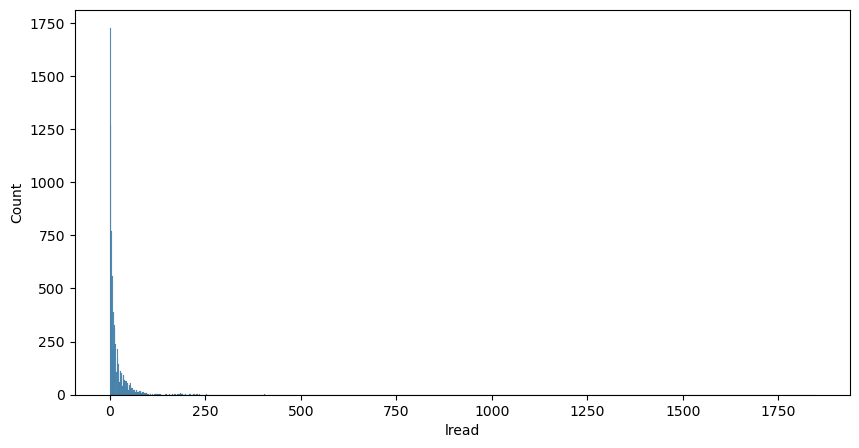

In [17]:
# a) lread
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'lread');

In [18]:
df_eda.lread.describe()

count    8192.000000
mean       19.559692
std        53.353799
min         0.000000
25%         2.000000
50%         7.000000
75%        20.000000
max      1845.000000
Name: lread, dtype: float64

**Observations**
- The average number reads between system memory and user memory is 19.56.
- lread ranges from 0 to 1845.
- About 75% of the lread fall under 20.

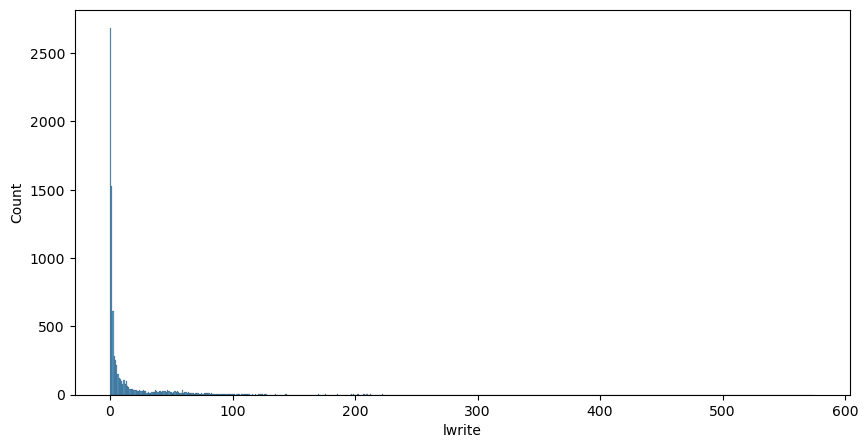

In [19]:
# b) lwrite
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'lwrite');

In [20]:
df_eda.lwrite.describe()

count    8192.000000
mean       13.106201
std        29.891726
min         0.000000
25%         0.000000
50%         1.000000
75%        10.000000
max       575.000000
Name: lwrite, dtype: float64

**Observations**
- The average number writes between system memory and user memory is 13.11.
- lwrite ranges from 0 to 575.
- About 75% of the lwrite fall under 10.

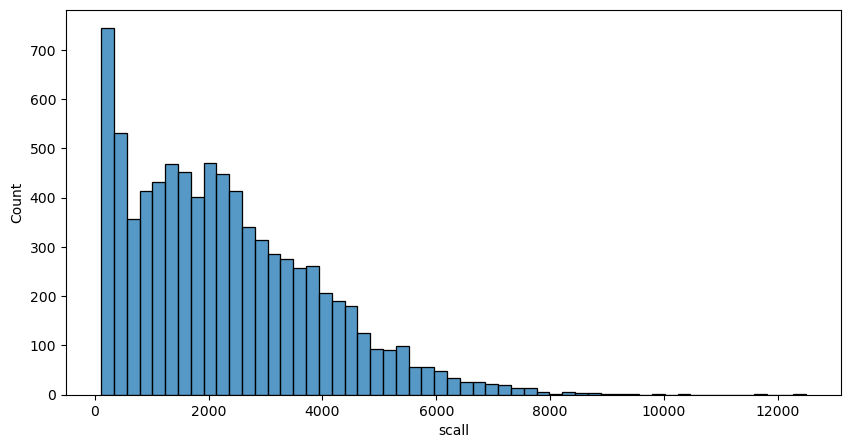

In [21]:
# c) scall
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'scall');

In [22]:
df_eda.scall.describe()

count     8192.000000
mean      2306.318237
std       1633.617322
min        109.000000
25%       1012.000000
50%       2051.500000
75%       3317.250000
max      12493.000000
Name: scall, dtype: float64

**Observations**
- The average number of system calls of all types per second is 2306.32.
- scall ranges from 109 to 12493.
- About 75% of the scall fall under 3317.25.

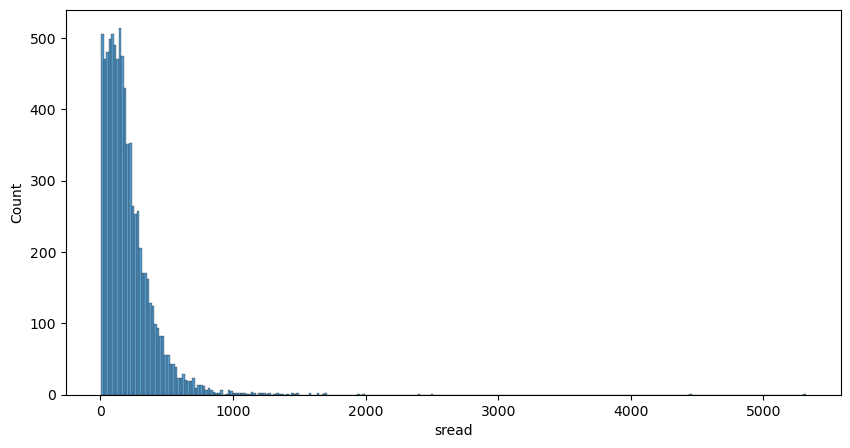

In [23]:
# d) sread
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'sread');

In [24]:
df_eda.sread.describe()

count    8192.000000
mean      210.479980
std       198.980146
min         6.000000
25%        86.000000
50%       166.000000
75%       279.000000
max      5318.000000
Name: sread, dtype: float64

**Observations**
- The average number of system read calls per second is 210.48.
- sread ranges from 6 to 5318.
- About 75% of the sread fall under 279.

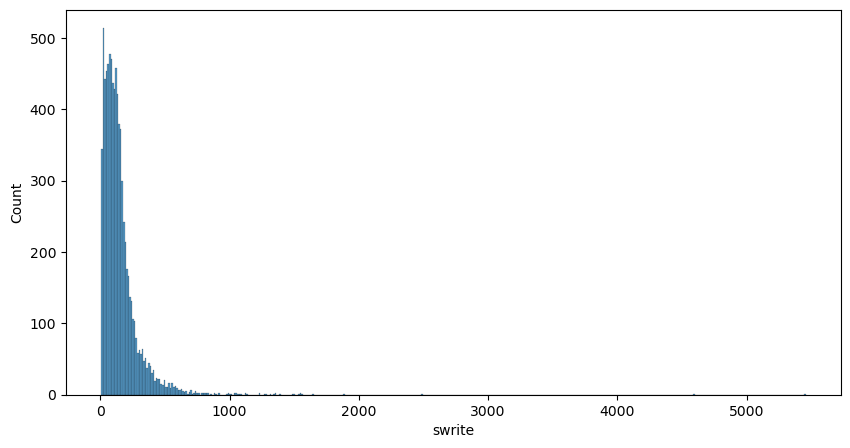

In [25]:
# e) swrite
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'swrite');

In [26]:
df_eda.swrite.describe()

count    8192.000000
mean      150.058228
std       160.478980
min         7.000000
25%        63.000000
50%       117.000000
75%       185.000000
max      5456.000000
Name: swrite, dtype: float64

**Observations**
- The average number of system write calls per second is 150.06.
- swrite ranges from 7 to 5456.
- About 25% and 75% of the swrite fall under 63 and 185.

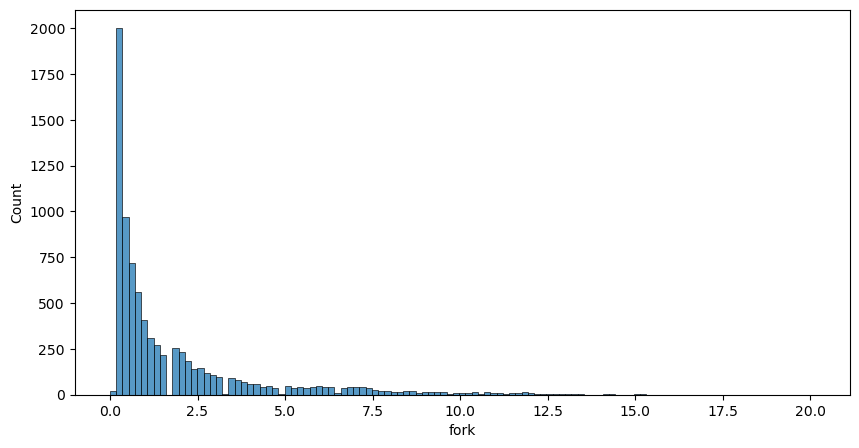

In [27]:
# f) fork
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'fork');

In [28]:
df_eda.fork.describe()

count    8192.000000
mean        1.884554
std         2.479493
min         0.000000
25%         0.400000
50%         0.800000
75%         2.200000
max        20.120000
Name: fork, dtype: float64

**Observations**
- The average number of system fork calls per second is 1.88.
- fork ranges from 0 to 20.12.
- About 25% and 75% of the fork fall under 0.40 and 2.20.

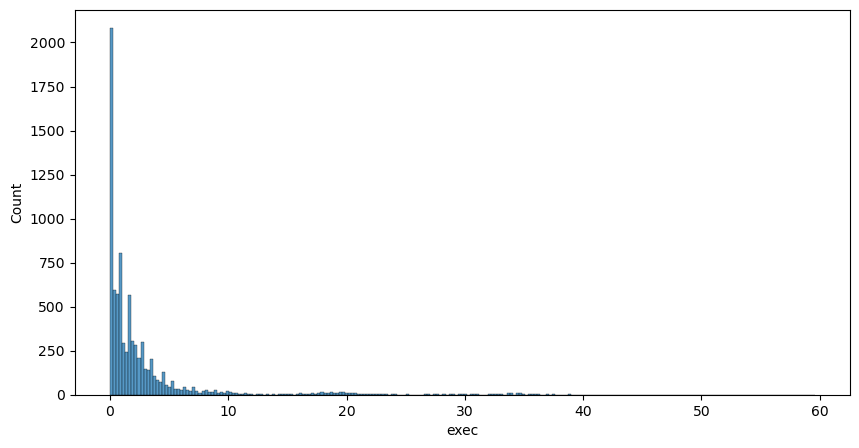

In [29]:
# g) exec
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'exec');

In [30]:
df_eda.exec.describe()

count    8192.000000
mean        2.791998
std         5.212456
min         0.000000
25%         0.200000
50%         1.200000
75%         2.800000
max        59.560000
Name: exec, dtype: float64

**Observations**
- The average number of system exec calls per second is 2.79.
- Exec ranges from 0 to 59.56.
- About 25% and 75% of the Exec fall under 0.20 and 2.80.

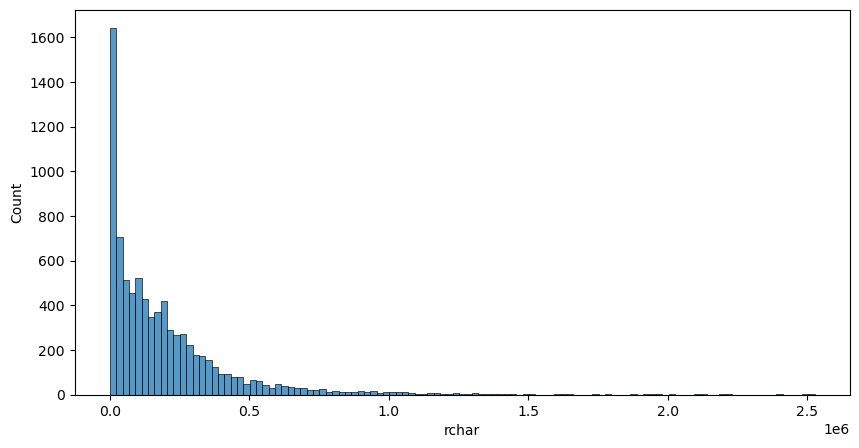

In [31]:
# h) rchar
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'rchar');

In [32]:
df_eda.rchar.describe()

count    8.192000e+03
mean     1.973857e+05
std      2.383100e+05
min      2.780000e+02
25%      3.486050e+04
50%      1.278250e+05
75%      2.653948e+05
max      2.526649e+06
Name: rchar, dtype: float64

**Observations**
- The average number of characters transferred per second by system read calls is 1.973857e+05.
- Rchar ranges from 2.780000e+02 to 2.526649e+06.
- About 25% and 75% of the rchar fall under 3.486050e+04 and 2.653948e+05.

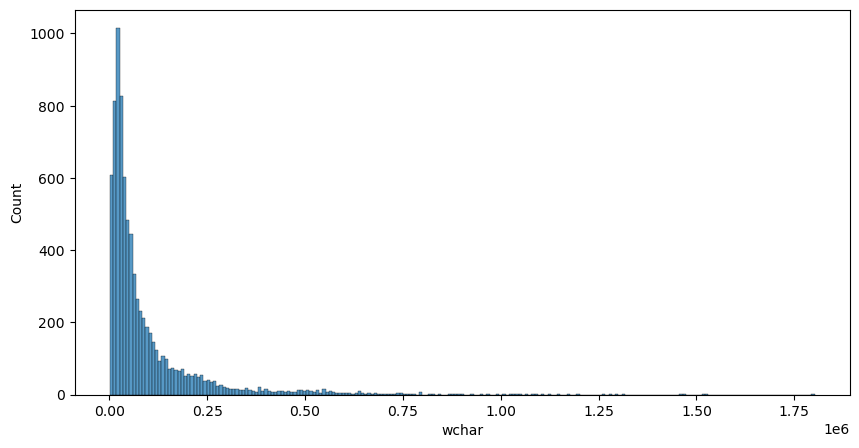

In [33]:
# i) wchar
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'wchar');

In [34]:
df_eda.wchar.describe()

count    8.192000e+03
mean     9.590299e+04
std      1.407127e+05
min      1.498000e+03
25%      2.297775e+04
50%      4.665300e+04
75%      1.060370e+05
max      1.801623e+06
Name: wchar, dtype: float64

**Observations**
- The average number of characters transferred per second by system write calls is 9.590299e+04.
- Wchar ranges from 1.498000e+03 to 1.801623e+06.
- About 25% and 75% of the wchar fall under 2.297775e+04 and 1.060370e+05.

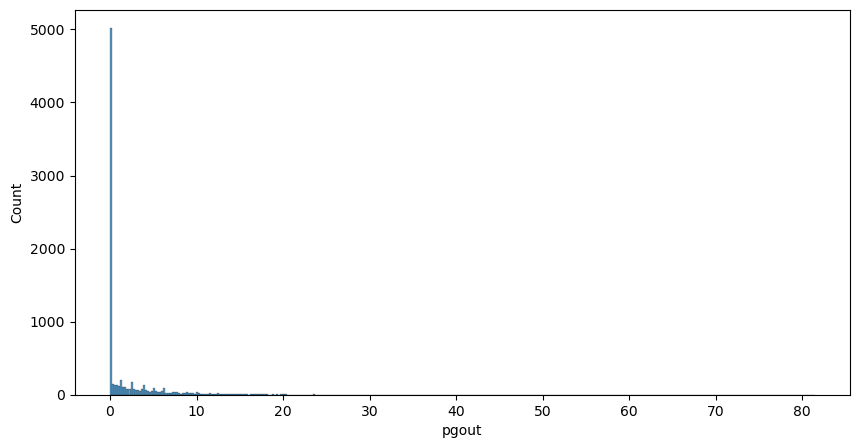

In [35]:
# j) pgout
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'pgout');

In [36]:
df_eda.pgout.describe()

count    8192.000000
mean        2.285317
std         5.307038
min         0.000000
25%         0.000000
50%         0.000000
75%         2.400000
max        81.440000
Name: pgout, dtype: float64

**Observations**
- The average number of page out requests per second is 2.29.
- pgout ranges from 0 to 81.44.
- About 75% of the pgout fall under 2.40.

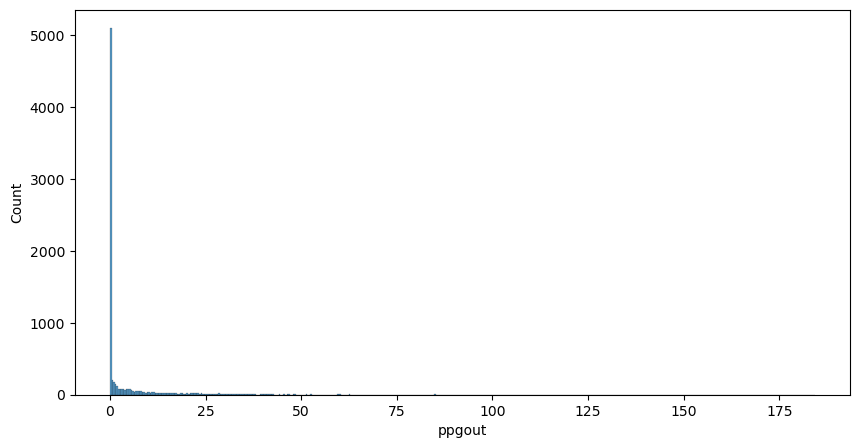

In [37]:
# k) ppgout
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'ppgout');

In [38]:
df_eda.ppgout.describe()

count    8192.000000
mean        5.977229
std        15.214590
min         0.000000
25%         0.000000
50%         0.000000
75%         4.200000
max       184.200000
Name: ppgout, dtype: float64

**Observations**
- The average number of pages, paged out per second is 5.98.
- ppgout ranges from 0 to 184.20.
- About 75% of the ppgout fall under 4.20.

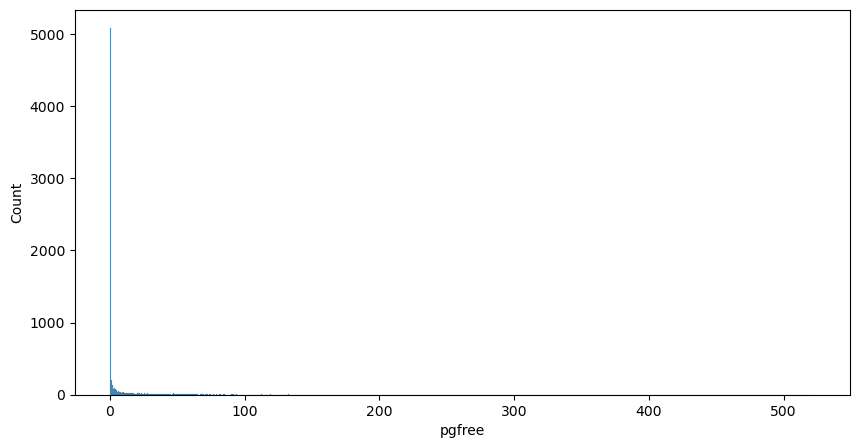

In [39]:
# l) pgfree
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'pgfree');

In [40]:
df_eda.pgfree.describe()

count    8192.000000
mean       11.919712
std        32.363520
min         0.000000
25%         0.000000
50%         0.000000
75%         5.000000
max       523.000000
Name: pgfree, dtype: float64

**Observations**
- The average number of pages per second placed on the free list is 11.92.
- pgfree ranges from 0 to 523.
- About 75% of the pgfree fall under 5.

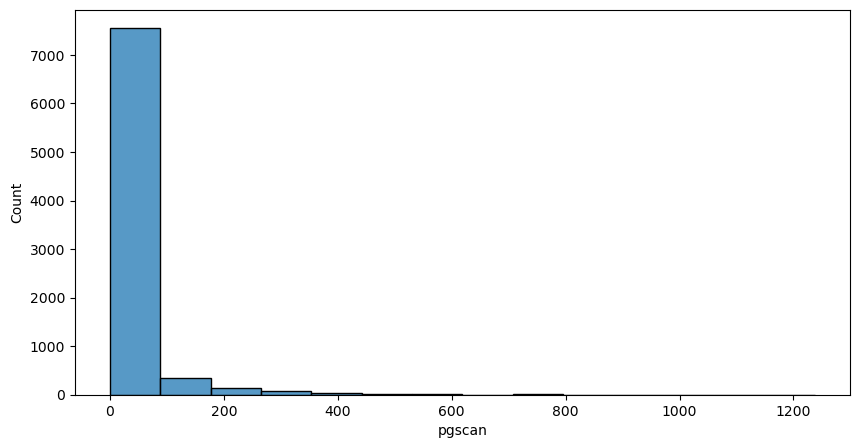

In [41]:
# m) pgscan
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'pgscan');

In [42]:
df_eda.pgscan.describe()

count    8192.000000
mean       21.526849
std        71.141340
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1237.000000
Name: pgscan, dtype: float64

**Observations**
- The average number of pages checked if they can be freed per second is 21.53.
- pgscan ranges from 0 to 1237.
- About 75% of the pgscan fall under 0.

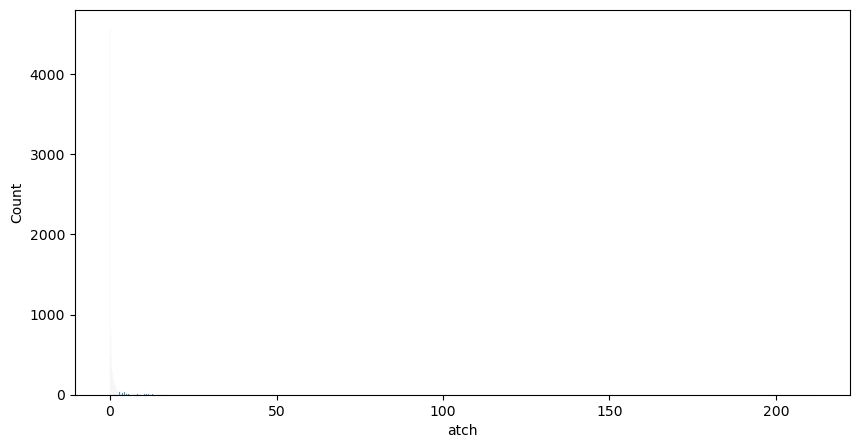

In [43]:
# n) atch
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'atch');

In [44]:
df_eda.atch.describe()

count    8192.000000
mean        1.127505
std         5.708347
min         0.000000
25%         0.000000
50%         0.000000
75%         0.600000
max       211.580000
Name: atch, dtype: float64

**Observations**
- The average number of page attaches (satisfying a page fault by reclaiming a page in memory) per second is 1.13.
- atch ranges from 0 to 211.58.
- About 25% and 75% of the atch fall under 0.00 and 0.60.

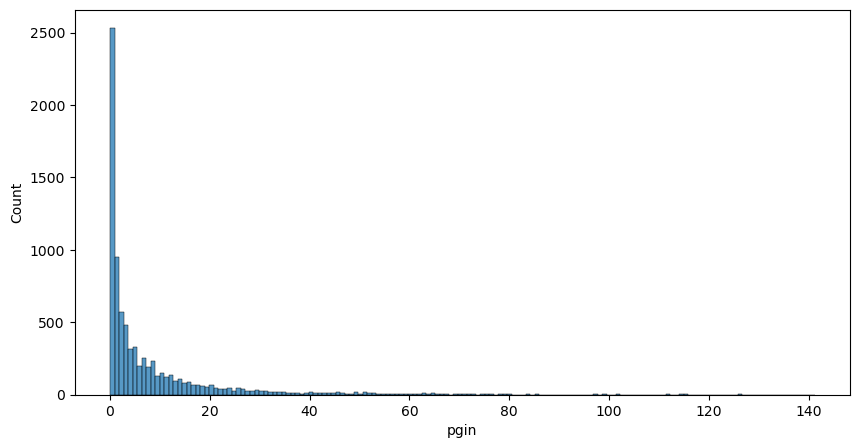

In [45]:
# o) pgin
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'pgin');

In [46]:
df_eda.pgin.describe()

count    8192.000000
mean        8.277960
std        13.874978
min         0.000000
25%         0.600000
50%         2.800000
75%         9.765000
max       141.200000
Name: pgin, dtype: float64

**Observations**
- The average number of page-in requests per second is 8.28.
- pgin ranges from 0 to 141.20.
- About 75% of the pgin fall under 9.77.

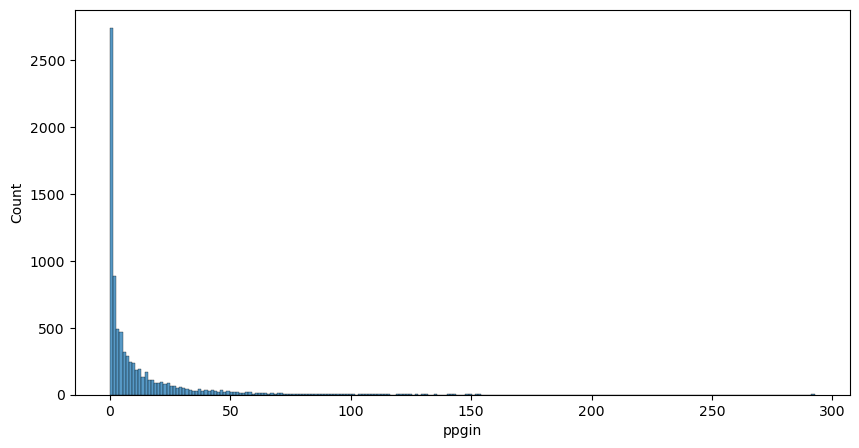

In [47]:
# p) ppgin
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'ppgin');

In [48]:
df_eda.ppgin.describe()

count    8192.000000
mean       12.388586
std        22.281318
min         0.000000
25%         0.600000
50%         3.800000
75%        13.800000
max       292.610000
Name: ppgin, dtype: float64

**Observations**
- The average number of pages paged in per second is 12.39.
- ppgin ranges from 0 to 13.80.
- About 75% of the ppgin fall under 13.80.

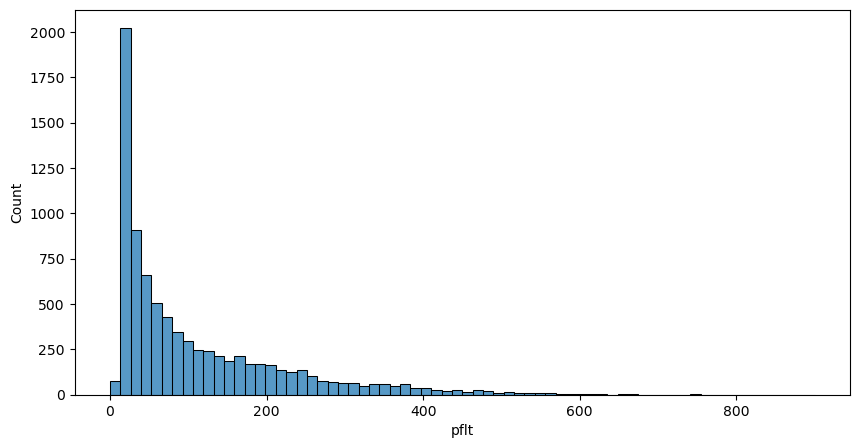

In [49]:
# q) pflt
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'pflt');

In [50]:
df_eda.pflt.describe()

count    8192.000000
mean      109.793799
std       114.419221
min         0.000000
25%        25.000000
50%        63.800000
75%       159.600000
max       899.800000
Name: pflt, dtype: float64

**Observations**
- The average number of page faults caused by protection errors (copy-on-writes) is 109.79.
- pflt ranges from 0 to 899.80.
- About 75% of the pflt fall under 159.60.

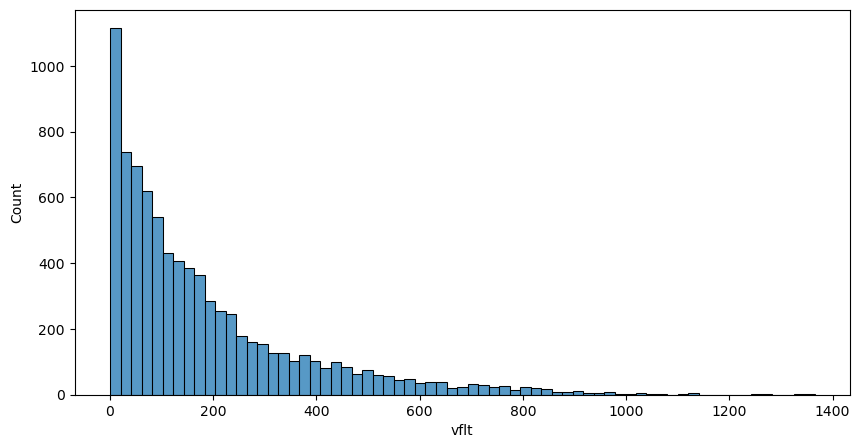

In [51]:
# r) vflt
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'vflt');

In [52]:
df_eda.vflt.describe()

count    8192.000000
mean      185.315796
std       191.000603
min         0.200000
25%        45.400000
50%       120.400000
75%       251.800000
max      1365.000000
Name: vflt, dtype: float64

**Observations**
- The average number of page faults caused by address translation is 185.32.
- vflt ranges from 0.20 to 1365.
- About 75% of the vflt fall under 251.80.

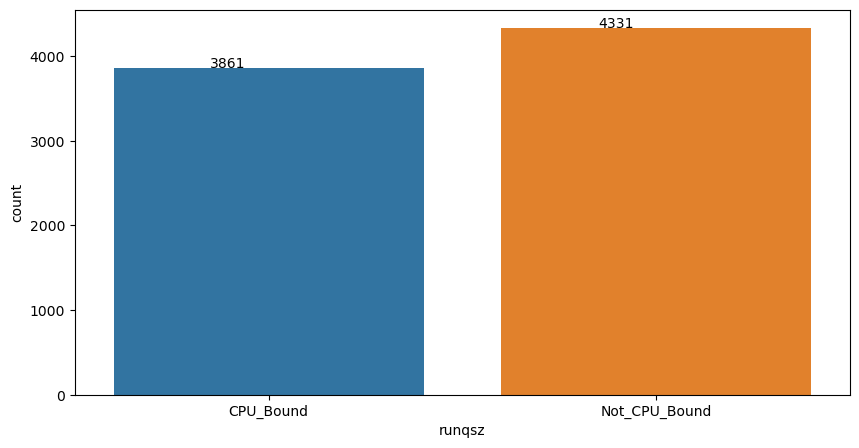

In [53]:
# s) runqsz
plt.figure(figsize=(10,5))
ax=sns.countplot(df_eda, x = 'runqsz')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

In [54]:
df_eda.runqsz.describe()

count              8192
unique                2
top       Not_CPU_Bound
freq               4331
Name: runqsz, dtype: object

**Observations**
- There are 2 unique values in runqsz variable.
- About 4331 of 8192 are Not_CPU_Bound.

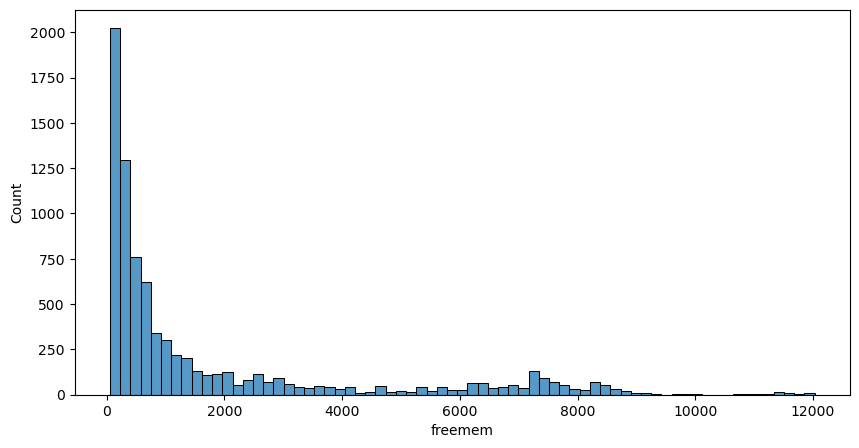

In [55]:
# t) freemem
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'freemem');

In [56]:
df_eda.freemem.describe()

count     8192.000000
mean      1763.456299
std       2482.104511
min         55.000000
25%        231.000000
50%        579.000000
75%       2002.250000
max      12027.000000
Name: freemem, dtype: float64

**Observations**
- The average number of memory pages available to user processes is 1763.46.
- freemem ranges from 55 to 12027.
- About 75% of the freemem fall under 2002.25.

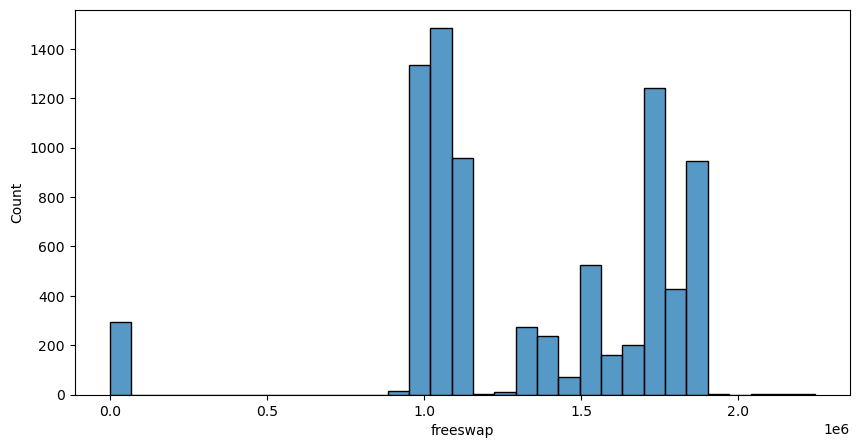

In [57]:
# u) freeswap
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'freeswap');

In [58]:
df_eda.freeswap.describe()

count    8.192000e+03
mean     1.328126e+06
std      4.220194e+05
min      2.000000e+00
25%      1.042624e+06
50%      1.289290e+06
75%      1.730380e+06
max      2.243187e+06
Name: freeswap, dtype: float64

**Observations**
- The average number of disk blocks available for page swapping is 1.328126e+06.
- freeswap ranges from 2.000000e+00 to 2.243187e+06.
- About 75% of the freeswap fall under 1.730380e+06.

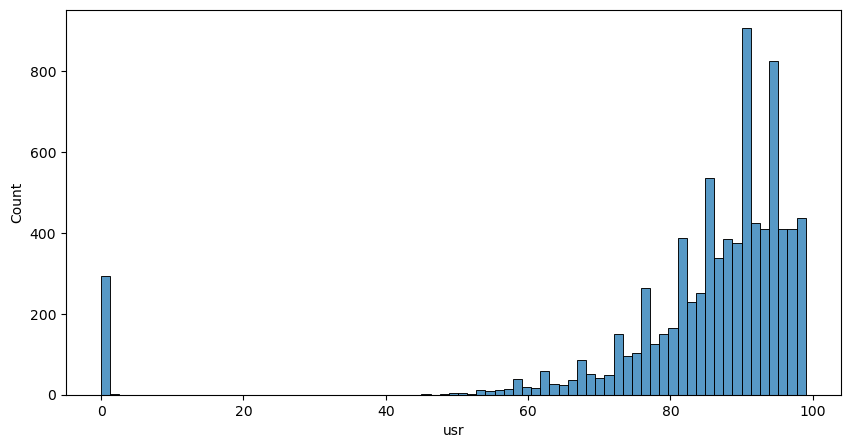

In [59]:
# v) usr
plt.figure(figsize=(10,5))
sns.histplot(df_eda, x = 'usr');

In [60]:
df_eda.usr.describe()

count    8192.000000
mean       83.968872
std        18.401905
min         0.000000
25%        81.000000
50%        89.000000
75%        94.000000
max        99.000000
Name: usr, dtype: float64

**Observations**
- The average Portion of time (%) that cpus run in user mode is 83.97.
- usr ranges from 0 to 99.
- About 75% of the usr fall under 94.

### Bivariate Analysis and Multivariate Analysis

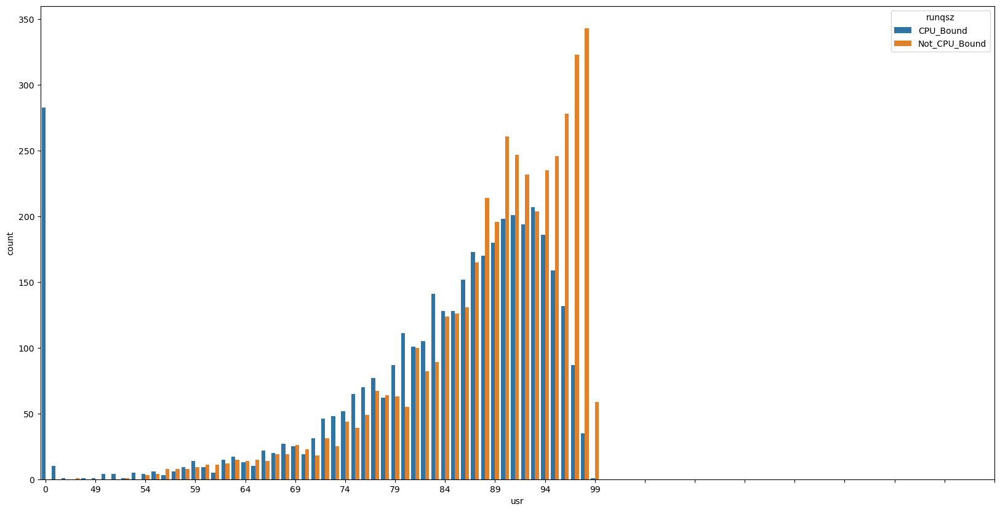

In [61]:
# a) runqsz and usr
plt.figure(figsize=(20,10))
ax=sns.countplot(data=df_eda, x='usr', hue='runqsz')
plt.xticks(range(0,100,5));

**Observations**
- As the portion of time (%) that cpus run in user mode increases, CPU bound decreases.

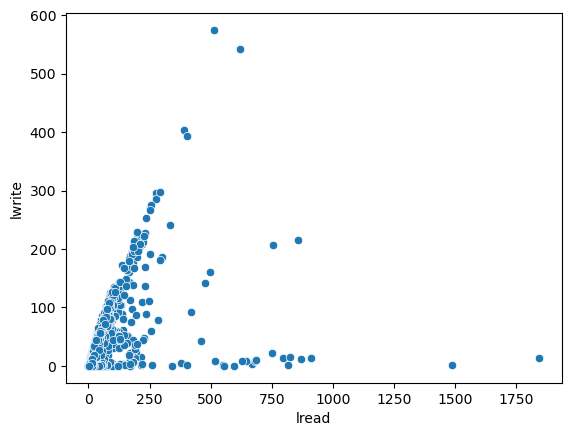

In [62]:
# b) lread and lwrite
ax=sns.scatterplot(data=df_eda, x="lread", y='lwrite') 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

In [63]:
df_eda[['lread', 'lwrite']].corr()

,lread,lwrite
lread,1.000000,0.533737
lwrite,0.533737,1.000000


In [64]:
df_eda[['lread', 'lwrite']].describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0


**Observations**
- The above graph states that there is a positive correlation of 0.53 between the lread and lwrite.
- The mean of lread and lwrite is 19.56 and 13.11.
- The std of lread and lwrite is 53.35 and 29.89.

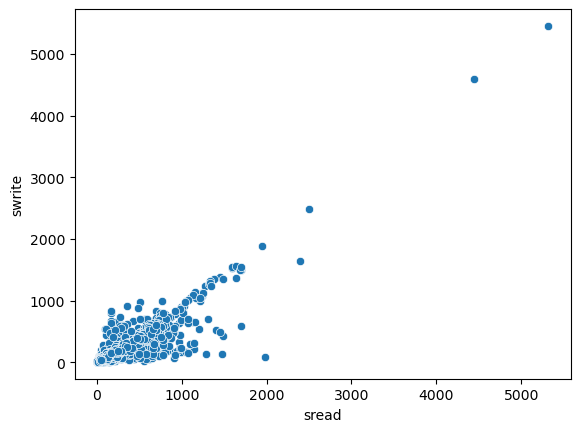

In [65]:
# c) sread and swrite
ax=sns.scatterplot(data=df_eda, x="sread", y='swrite') 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

In [66]:
df_eda[['sread', 'swrite']].corr()

,sread,swrite
sread,1.000000,0.881069
swrite,0.881069,1.000000


In [67]:
df_eda[['sread', 'swrite']].describe().T

,count,mean,std,min,25%,50%,75%,max
sread,8192.0,210.479980,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,150.058228,160.478980,7.0,63.0,117.0,185.0,5456.0


**Observations**
- The above graph states that there is a positive correlation of 0.88 between the sread and swrite.
- The mean of sread and swrite is 210.48 and 150.06.
- The std of sread and swrite is 198.98 and 160.48.

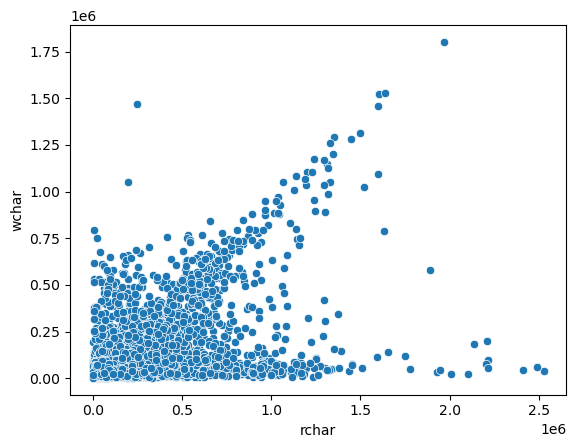

In [68]:
# d) rchar and wchar
ax=sns.scatterplot(data=df_eda, x="rchar", y='wchar') 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

In [69]:
df_eda[['rchar', 'wchar']].corr()

,rchar,wchar
rchar,1.000000,0.499825
wchar,0.499825,1.000000


In [70]:
df_eda[['rchar', 'wchar']].describe().T

,count,mean,std,min,25%,50%,75%,max
rchar,8192.0,197385.728363,238310.037735,278.0,34860.50,127825.0,265394.75,2526649.0
wchar,8192.0,95902.992785,140712.688639,1498.0,22977.75,46653.0,106037.00,1801623.0


**Observations**
- The above graph states that there is a positive correlation of 0.50 between the rchar and wchar.
- The mean of rchar and wchar is 197385.73 and 95903.
- The std of rchar and wchar is 238310.04 and 140712.69.

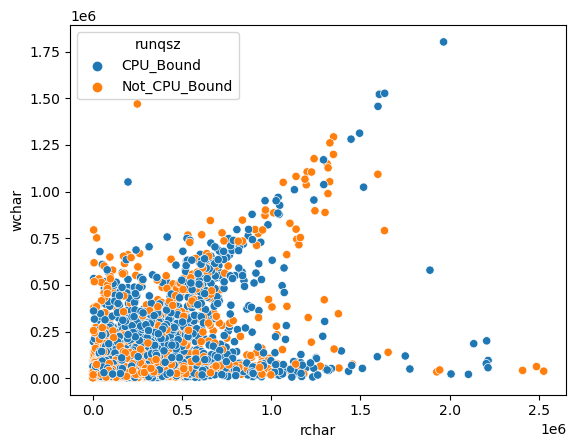

In [71]:
# e) rchar, wchar and runqsz
ax=sns.scatterplot(data=df_eda, x="rchar", y='wchar', hue='runqsz') 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

In [72]:
df_eda[['rchar', 'wchar']].corr()

,rchar,wchar
rchar,1.000000,0.499825
wchar,0.499825,1.000000


In [73]:
df_eda.runqsz.describe()

count              8192
unique                2
top       Not_CPU_Bound
freq               4331
Name: runqsz, dtype: object

**Observations**
- The above graph states that there is a positive correlation of 0.50 between the rchar and wchar.
- About 4331 of 8192 are Not_CPU_Bound.

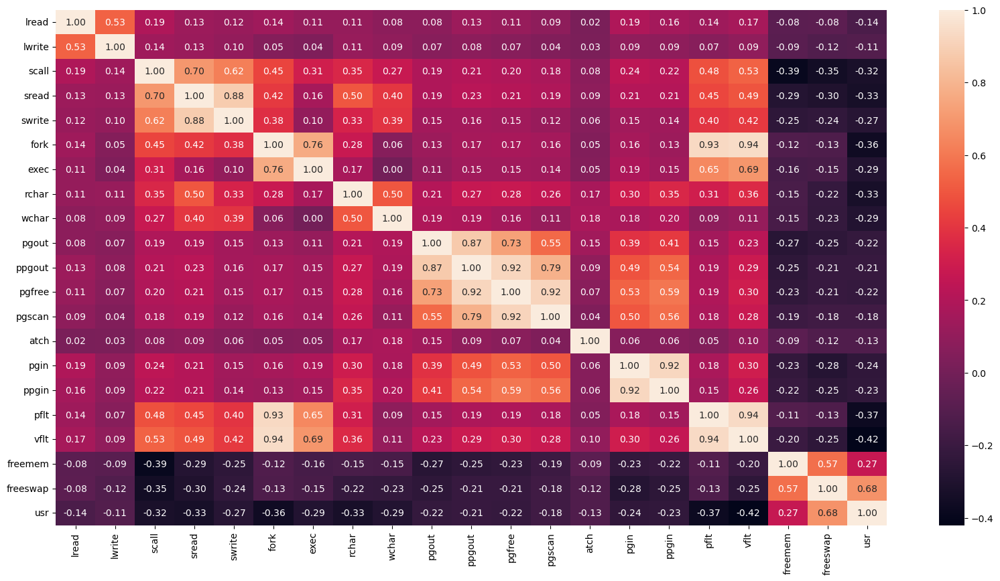

In [74]:
# f) Correlation
plt.figure(figsize = (20,10))
sns.heatmap(df_eda.corr(), annot=True,fmt='.2f');

**Observations**
- There are few variables which are highly correlated to each other, as their values are close to 1.
- Few variables have negative values which represents negative correlation between each other.

<Figure size 2000x1000 with 0 Axes>

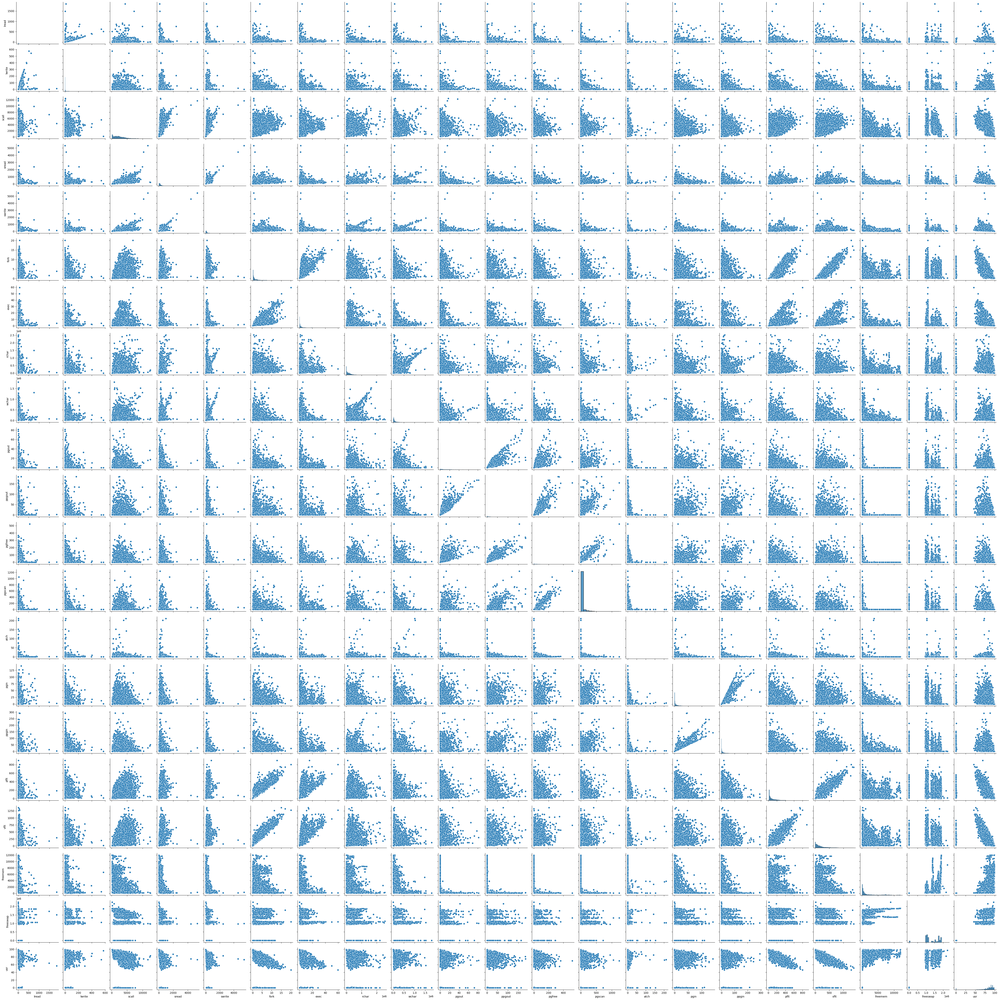

In [75]:
# g) Pairplot
plt.figure(figsize = (20,10))
sns.pairplot(data=df_eda[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr']]);

## 1.2) Ans: 

In [76]:
# Imputing null values with mean
for column in df.columns:
    if df[column].dtype != 'object':
        mean = df[column].mean()
        df[column] = df[column].fillna(mean)    
        
df.isnull().sum() 

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [77]:
# Number of zeroes in each column
for column_name in df.columns:
    column = df[column_name]
    count = (column == 0).sum()
    print(column_name,   count)

lread 675
lwrite 2684
scall 0
sread 0
swrite 0
fork 21
exec 21
rchar 0
wchar 0
pgout 4878
ppgout 4878
pgfree 4869
pgscan 6448
atch 4575
pgin 1220
ppgin 1220
pflt 3
vflt 0
runqsz 0
freemem 0
freeswap 0
usr 283


In [78]:
df_num= df.select_dtypes(include=['float64','int64'])
df_num.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr'],
      dtype='object')

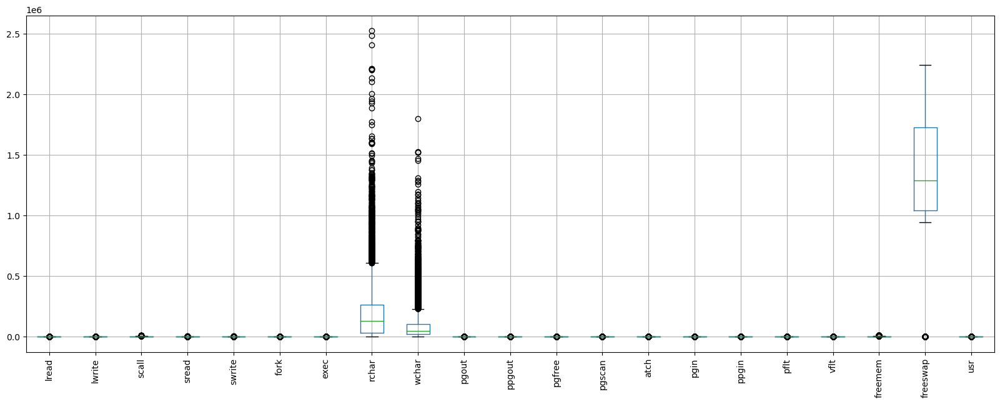

In [79]:
df_num.boxplot(figsize=(20,7))
plt.xticks(rotation=90)
plt.show()

lread


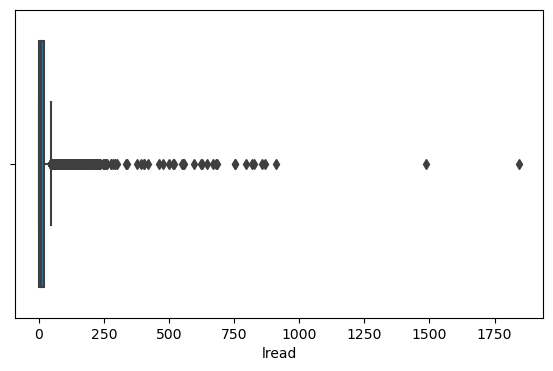

lwrite


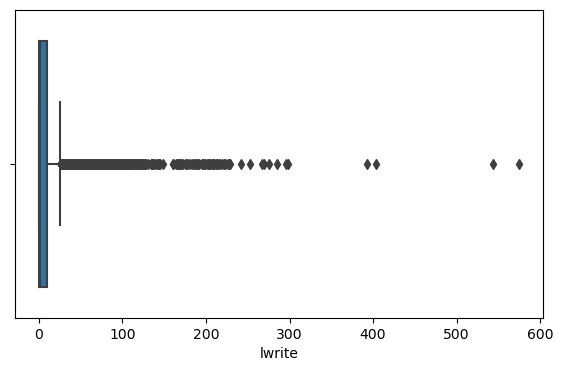

scall


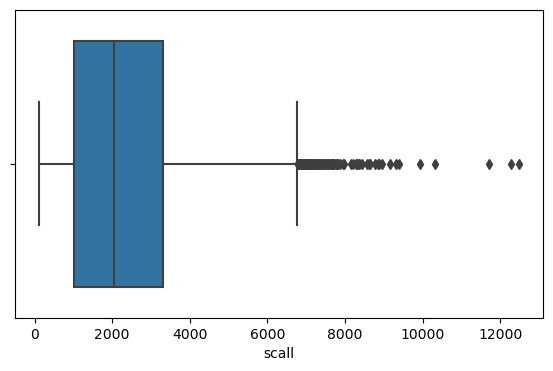

sread


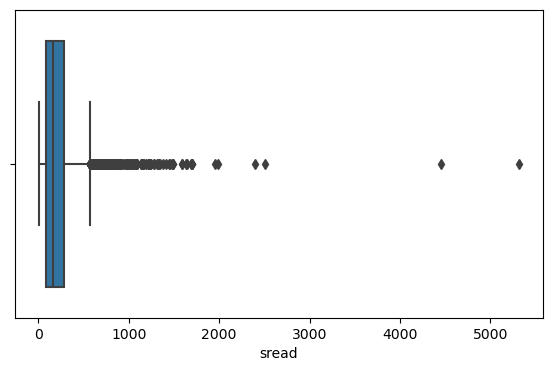

swrite


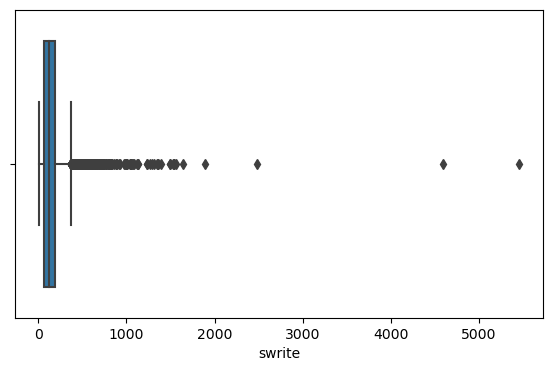

fork


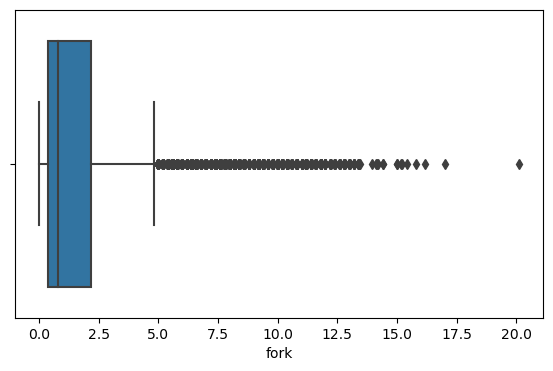

exec


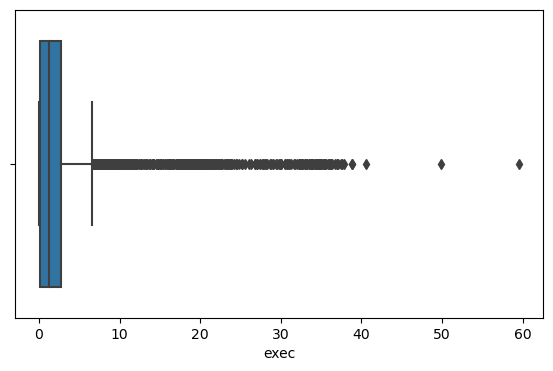

rchar


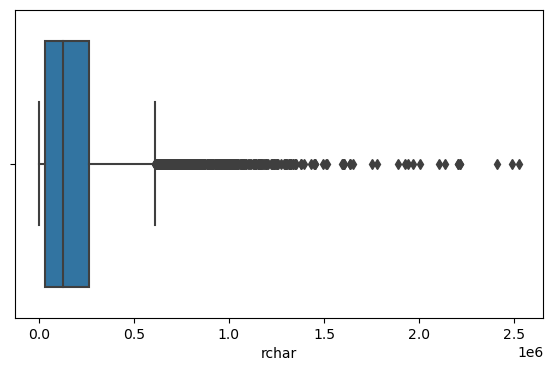

wchar


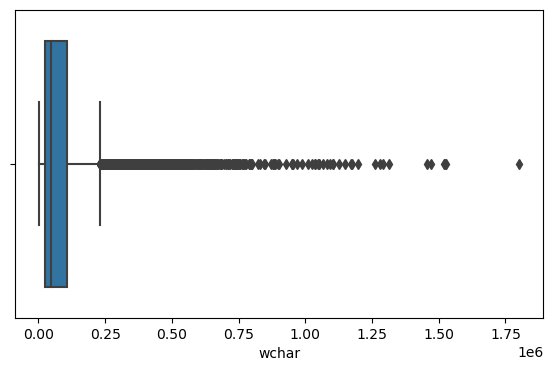

pgout


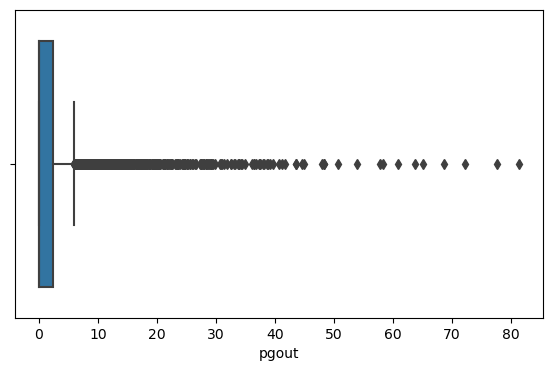

ppgout


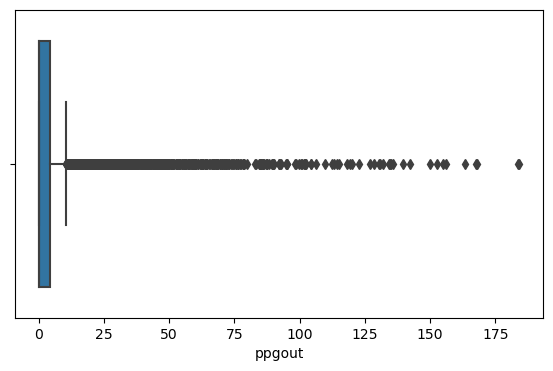

pgfree


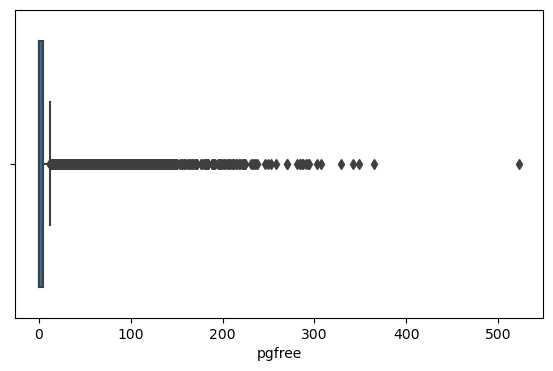

pgscan


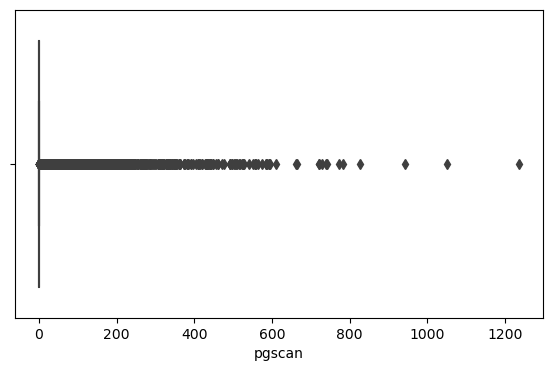

atch


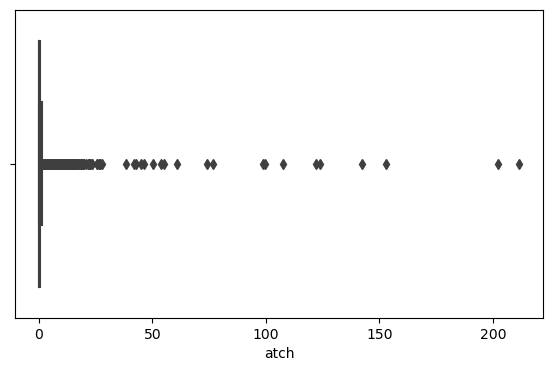

pgin


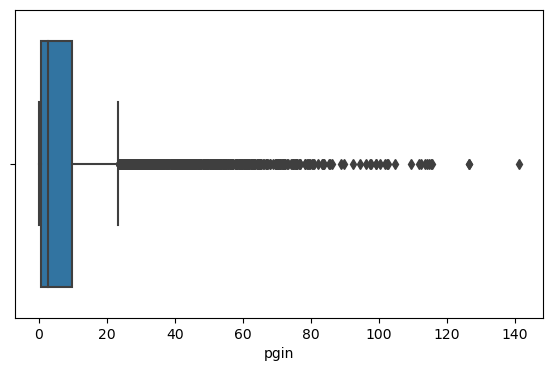

ppgin


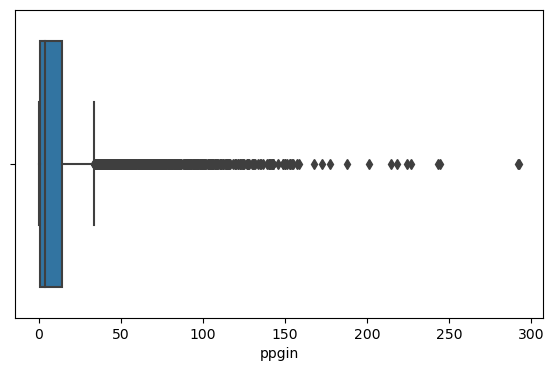

pflt


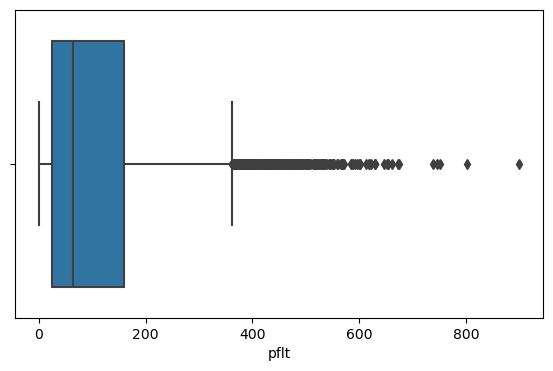

vflt


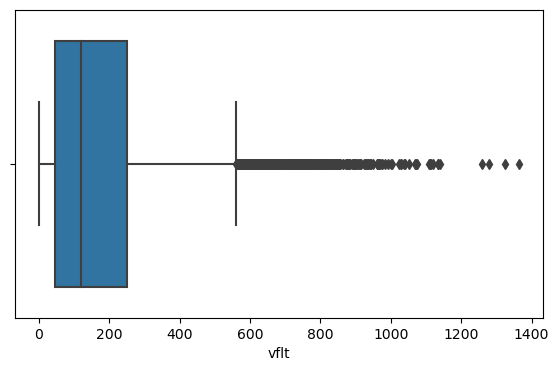

freemem


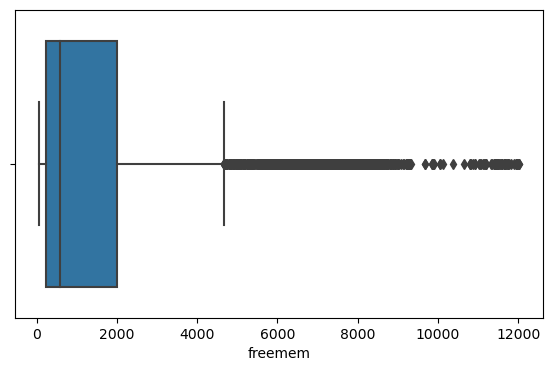

freeswap


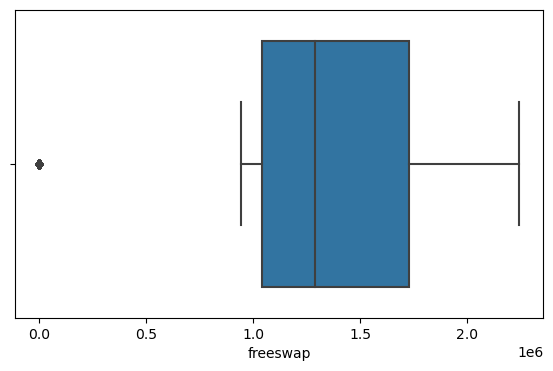

usr


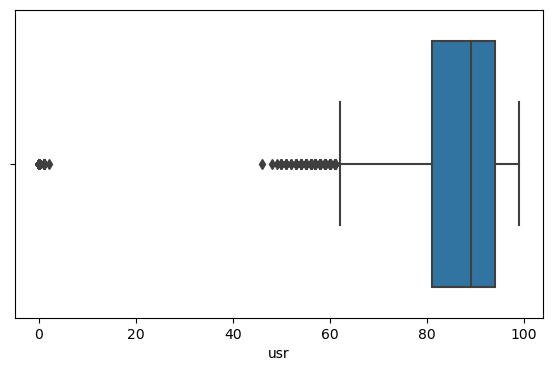

In [80]:
for col in df_num.columns[0:]:
    print(col)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    sns.boxplot(x=df_num[col])
    plt.show()

In [81]:
def treat_outlier(x):
    q5= np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    dt=np.percentile(x,95)
    IQR=q75-q25
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    return x.apply(lambda y: q5 if y < lower_bound else y).apply(lambda y: dt if y > upper_bound else y)

In [82]:
for i in df_num.columns:    
    df_num[i]=treat_outlier(df_num[i])

lread


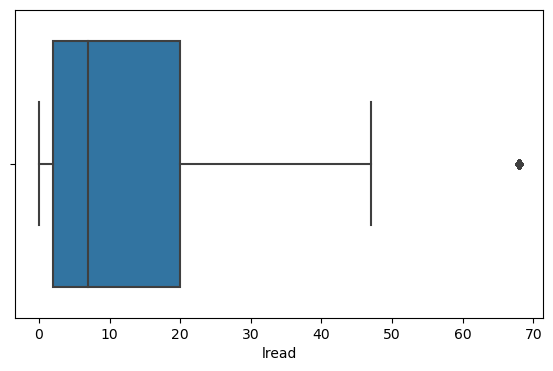

lwrite


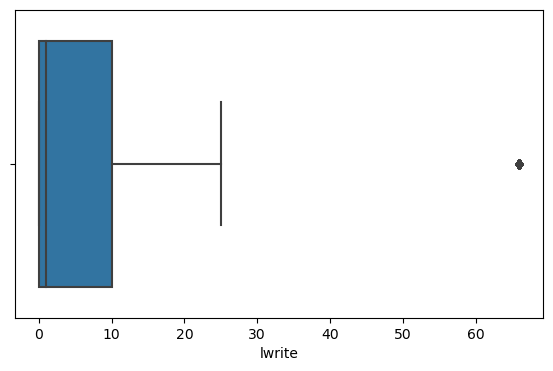

scall


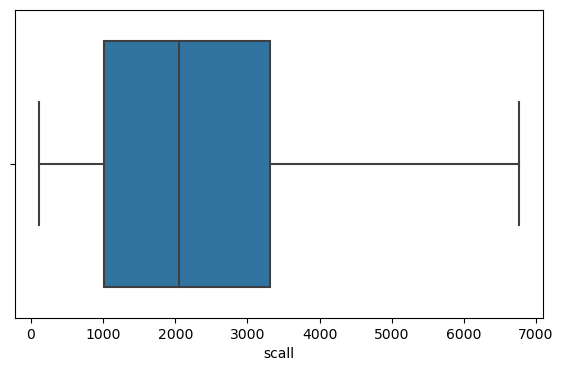

sread


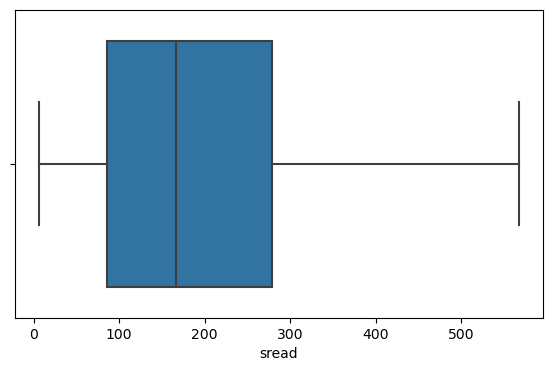

swrite


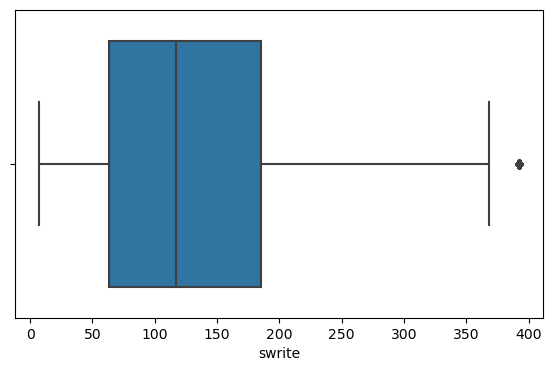

fork


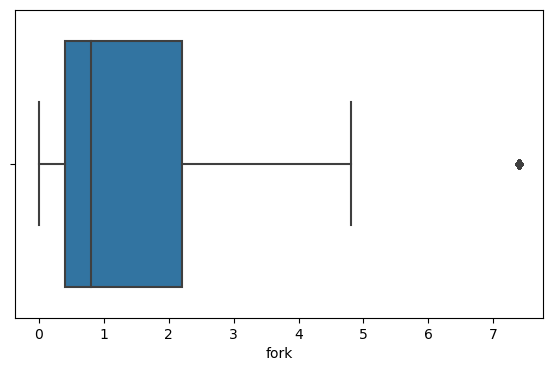

exec


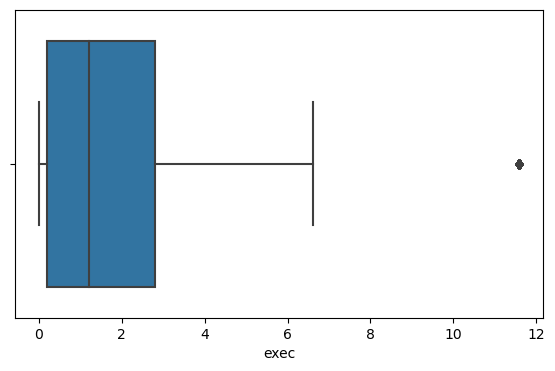

rchar


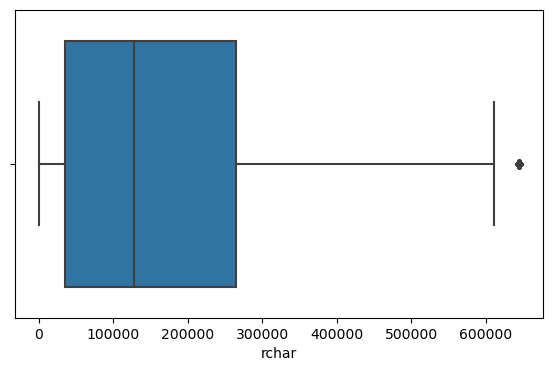

wchar


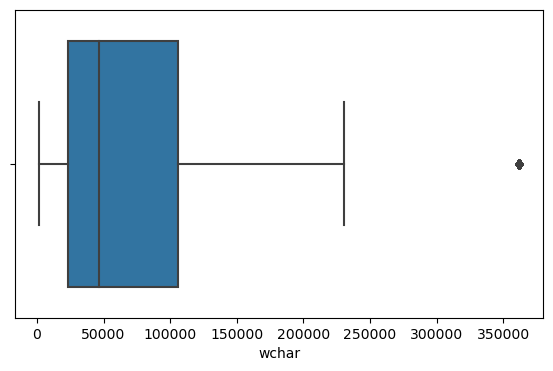

pgout


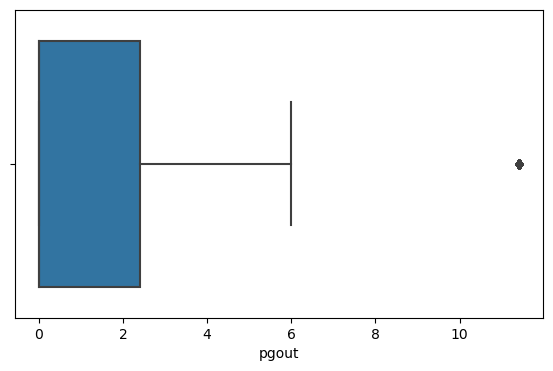

ppgout


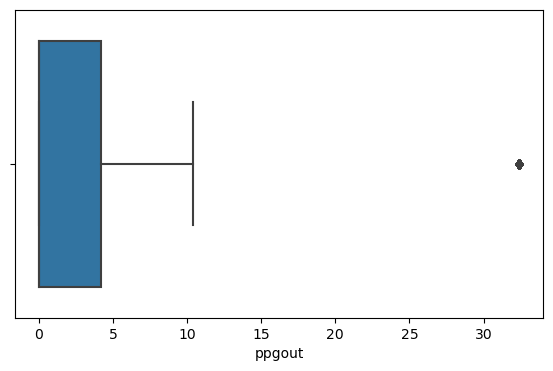

pgfree


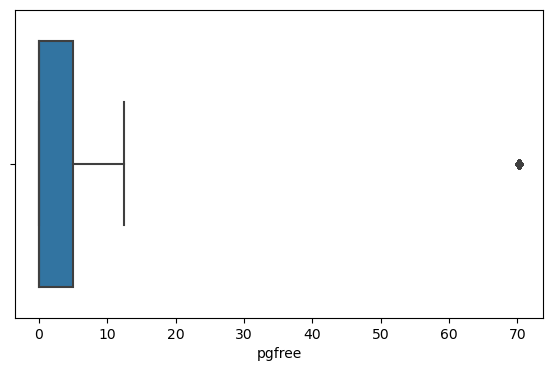

pgscan


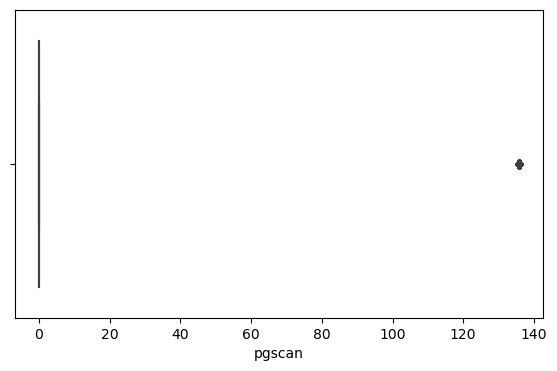

atch


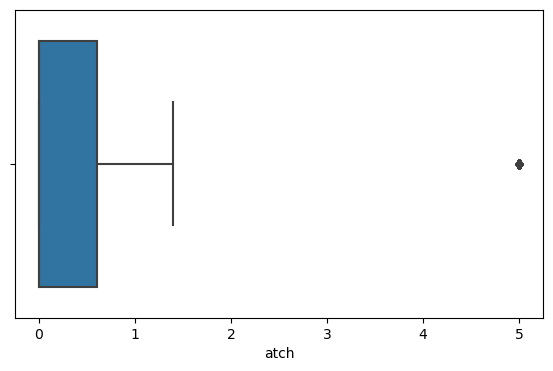

pgin


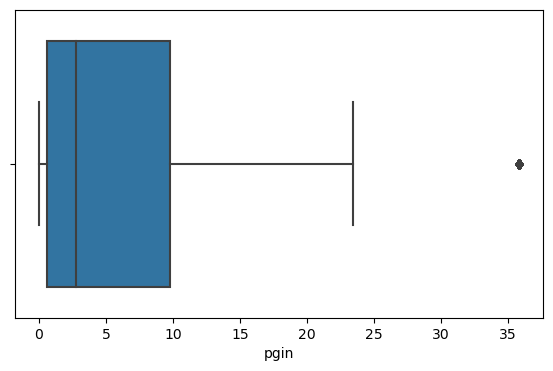

ppgin


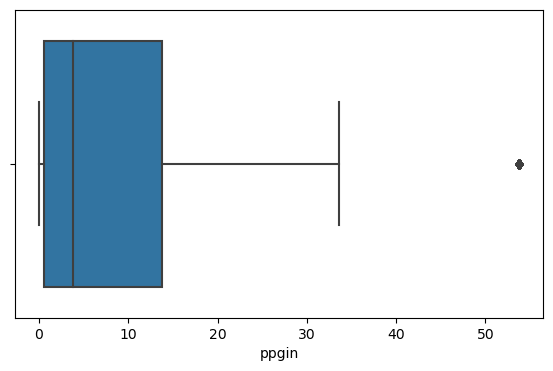

pflt


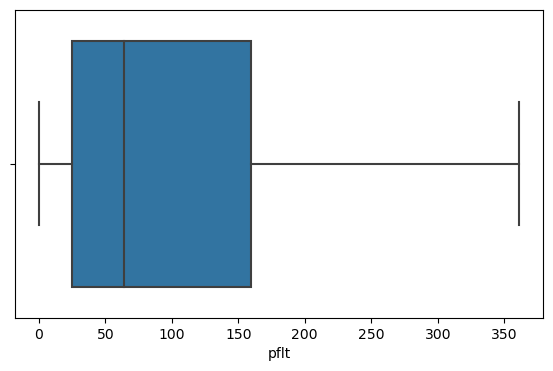

vflt


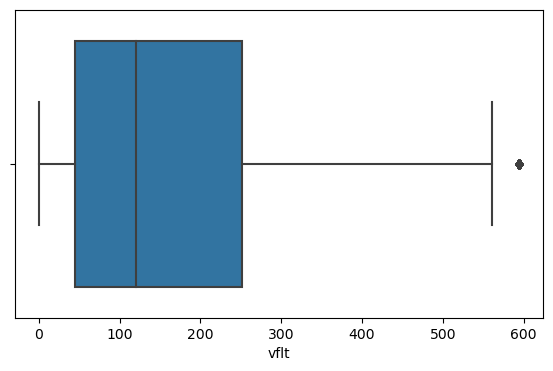

freemem


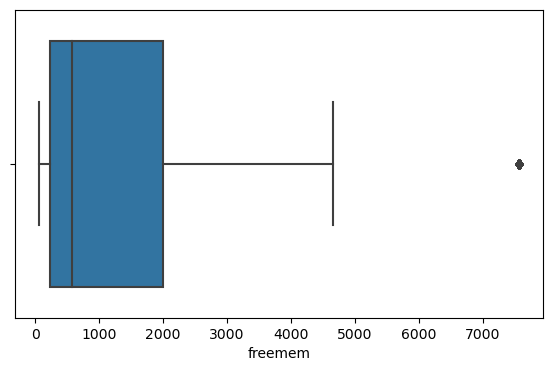

freeswap


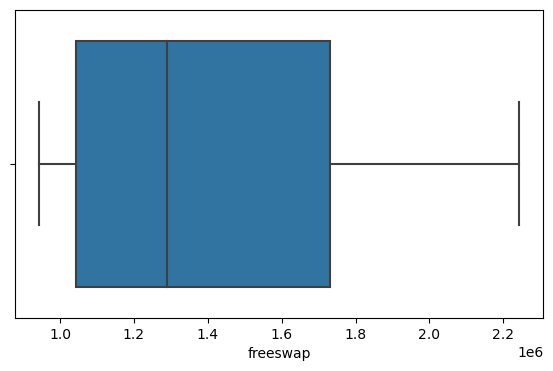

usr


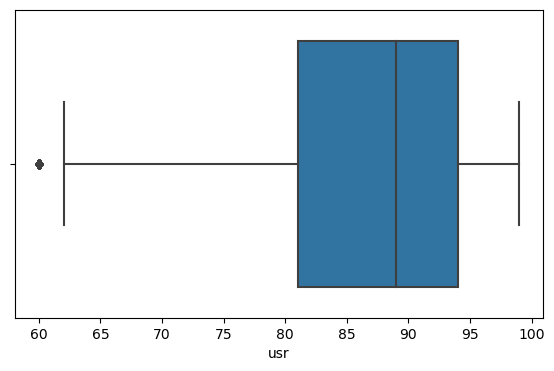

In [83]:
for col in df_num.columns[0:]:
    print(col)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    sns.boxplot(x=df_num[col])
    plt.show()

In [84]:
# Duplicate values
dups=df.duplicated().sum()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


## 1.3) Ans: 

In [85]:
#Data encoding
df = pd.get_dummies(df, columns=['runqsz'],drop_first=True)

In [86]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   int64  
 1   lwrite                8192 non-null   int64  
 2   scall                 8192 non-null   int64  
 3   sread                 8192 non-null   int64  
 4   swrite                8192 non-null   int64  
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8192 non-null   float64
 8   wchar                 8192 non-null   float64
 9   pgout                 8192 non-null   float64
 10  ppgout                8192 non-null   float64
 11  pgfree                8192 non-null   float64
 12  pgscan                8192 non-null   float64
 13  atch                  8192 non-null   float64
 14  pgin                  8192 non-null   float64
 15  ppgin                

In [88]:
df.isnull().sum()

lread                   0
lwrite                  0
scall                   0
sread                   0
swrite                  0
fork                    0
exec                    0
rchar                   0
wchar                   0
pgout                   0
ppgout                  0
pgfree                  0
pgscan                  0
atch                    0
pgin                    0
ppgin                   0
pflt                    0
vflt                    0
freemem                 0
freeswap                0
usr                     0
runqsz_Not_CPU_Bound    0
dtype: int64

In [89]:
def treat_outlier(x):
    q5= np.percentile(x,5)
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    dt=np.percentile(x,95)
    IQR=q75-q25
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    return x.apply(lambda y: q5 if y < lower_bound else y).apply(lambda y: dt if y > upper_bound else y)

In [90]:
for i in df.columns:    
    df[i]=treat_outlier(df[i])

lread


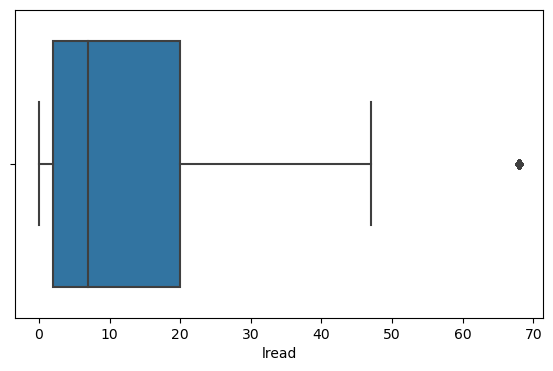

lwrite


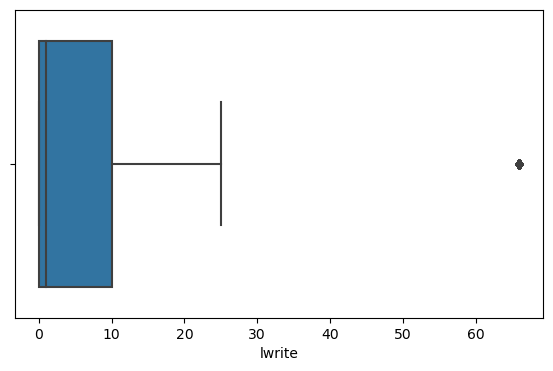

scall


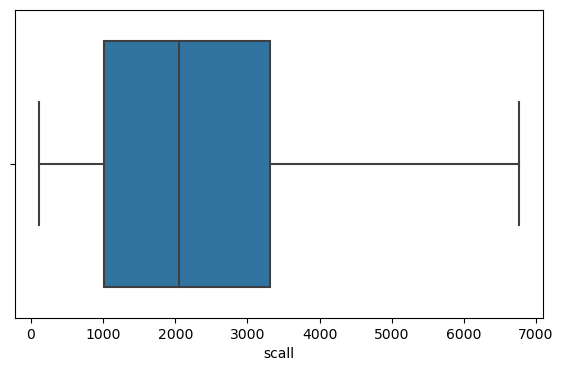

sread


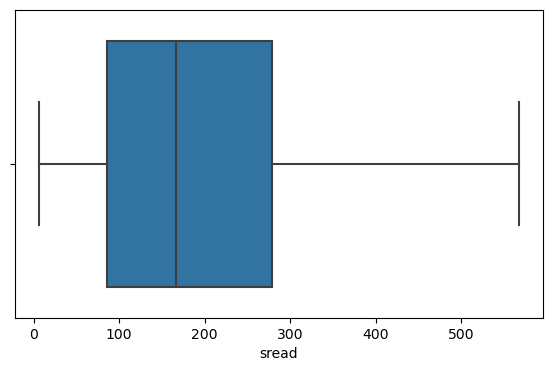

swrite


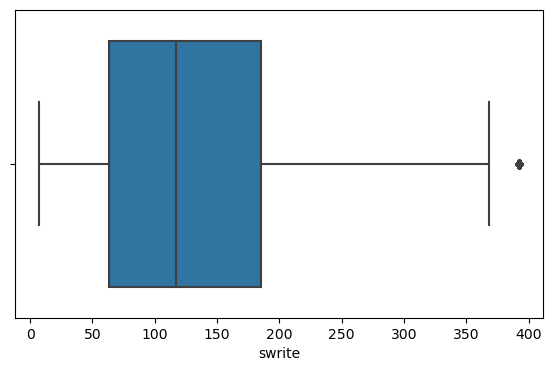

fork


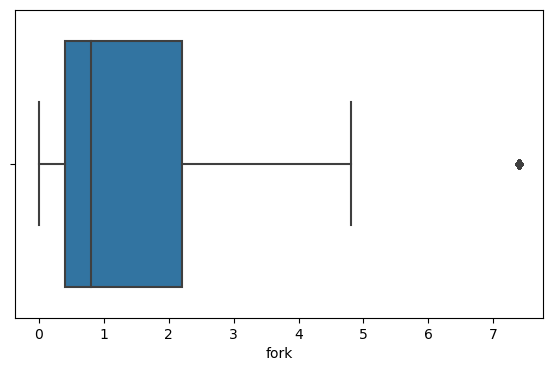

exec


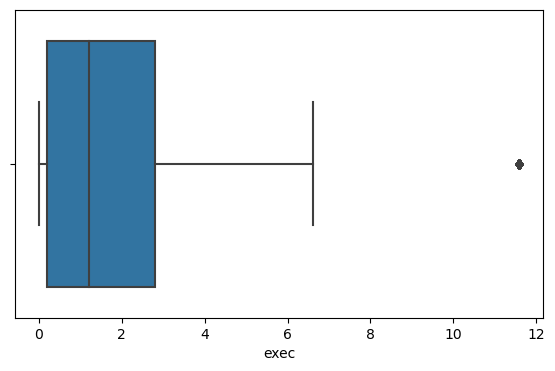

rchar


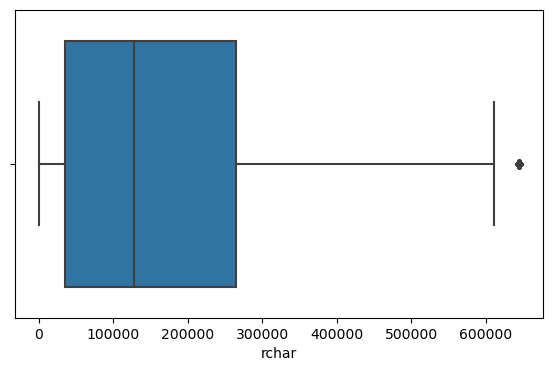

wchar


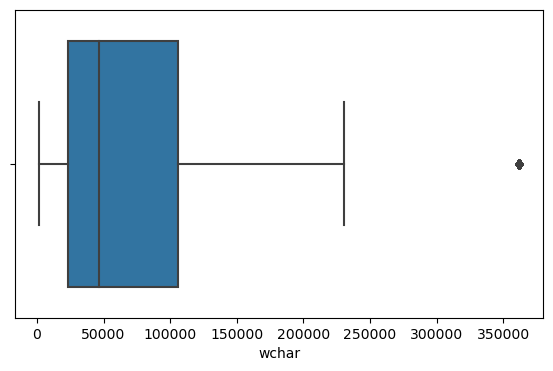

pgout


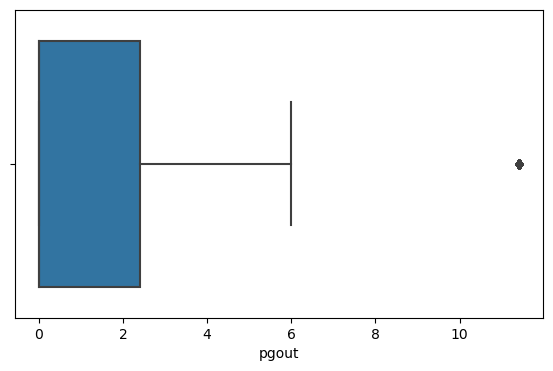

ppgout


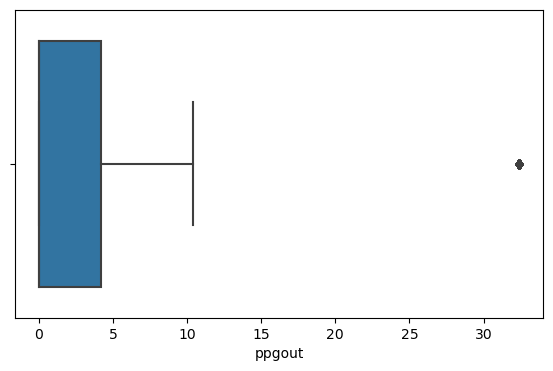

pgfree


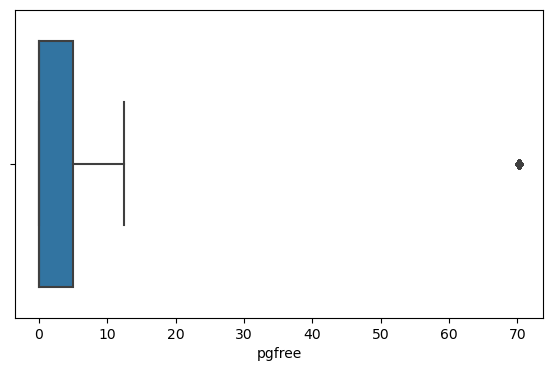

pgscan


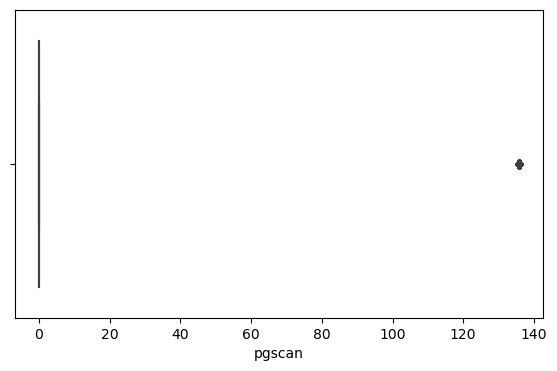

atch


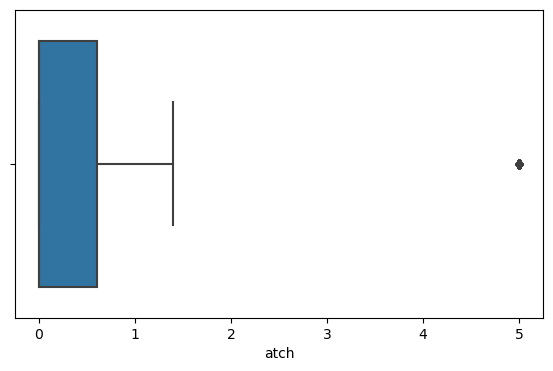

pgin


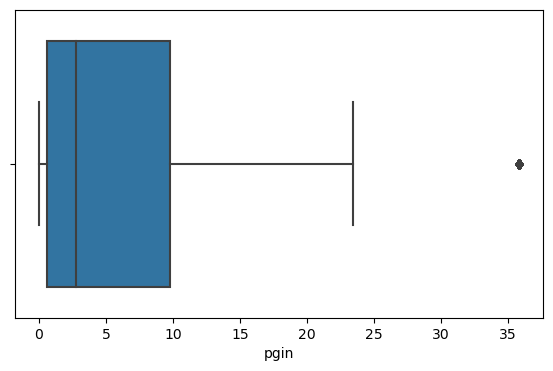

ppgin


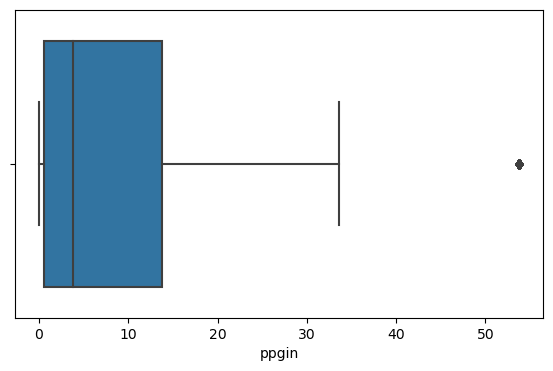

pflt


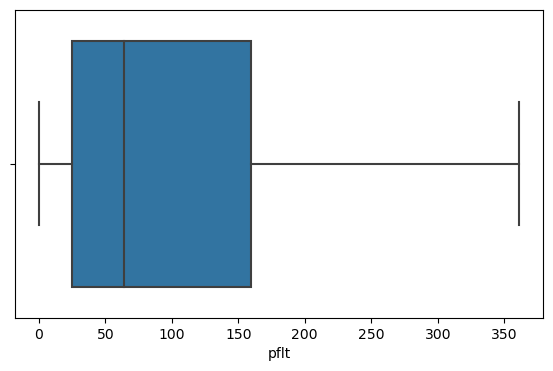

vflt


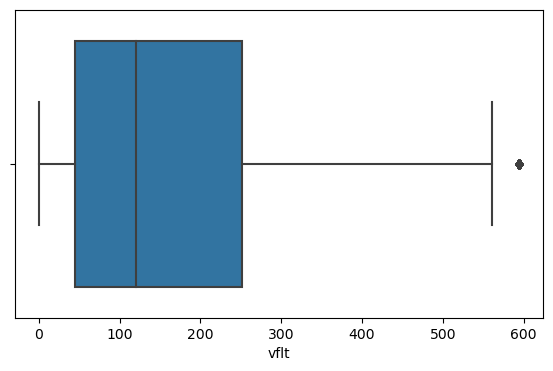

freemem


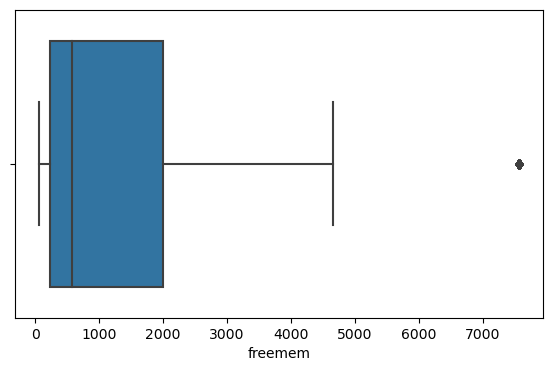

freeswap


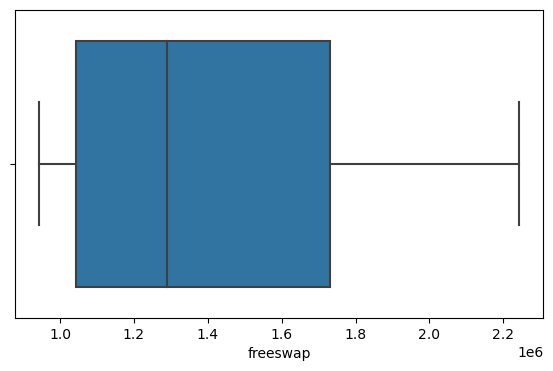

usr


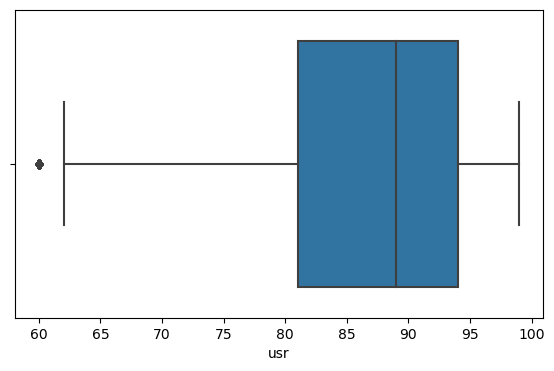

runqsz_Not_CPU_Bound


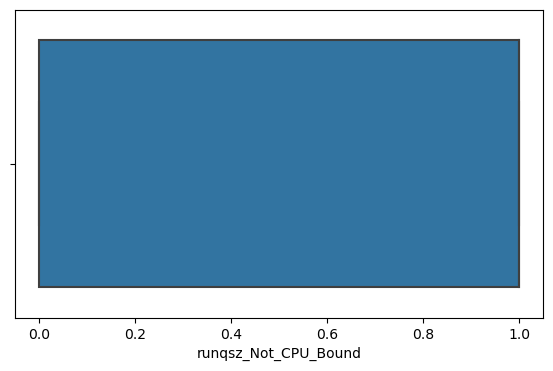

In [91]:
for col in df.columns[0:]:
    print(col)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    sns.boxplot(x=df[col])
    plt.show()

In [92]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr', 'runqsz_Not_CPU_Bound'],
      dtype='object')

**Train-Test split**

In [93]:
# Independent variables
X = df.drop('usr', axis=1)

# Dependent variables 
y = df[['usr']]

In [94]:
y.head()

,usr
0,95.0
1,97.0
2,87.0
3,98.0
4,90.0


In [95]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=123)

In [96]:
print(X_train.head())

      lread  lwrite   scall  sread  swrite  fork    exec     rchar    wchar  \
6781    1.0     1.0  2078.0   94.0    97.0   0.4   0.400   30254.0  10055.0   
6762   68.0    18.0  4432.0  533.0   222.0   7.4  11.589  386448.0  38136.0   
1308    7.0     3.0  2304.0   99.0    69.0   0.6   0.600  146483.0  27071.0   
4086   25.0    66.0  1039.0  112.0    45.0   0.8   1.200  243641.0  36586.0   
1621    2.0     0.0   386.0   42.0    14.0   2.2   2.200   92461.0  20544.0   

      pgout  ...  pgfree    pgscan  atch     pgin  ppgin    pflt      vflt  \
6781   0.20  ...    0.20    0.0000   0.0   1.0000   1.40   23.80   40.0000   
6762  11.42  ...   70.29  135.8385   5.0  35.8315  29.74  357.25  594.4845   
1308   0.00  ...    0.00    0.0000   0.0   1.0000   1.60   57.60   52.2000   
4086   0.00  ...    0.00    0.0000   0.0   1.8000   3.20   66.80  108.4000   
1621   0.00  ...    0.00    0.0000   0.0   2.2000   4.00  208.80  178.0000   

      freemem   freeswap  runqsz_Not_CPU_Bound  
6781   

In [97]:
print(X_test.head())

      lread  lwrite   scall  sread  swrite  fork  exec      rchar     wchar  \
5455    2.0     0.0   817.0   43.0   73.00   0.4   0.8  102203.00   26343.0   
152     5.0     3.0  3694.0  533.0  392.45   2.4   2.2  644761.85  361894.6   
6394    0.0     0.0   820.0  157.0   68.00   0.4   0.4  212904.00  156341.0   
7509    2.0     0.0  2560.0  286.0  237.00   0.8   3.6  218944.00  361894.6   
6343   12.0    18.0  1207.0  280.0  200.00   0.2   0.2   13777.00   74406.0   

      pgout  ...  pgfree  pgscan  atch     pgin  ppgin    pflt    vflt  \
5455    0.0  ...     0.0     0.0   0.2   2.0000   2.20   34.40   47.60   
152     2.0  ...     2.0     0.0   0.8  35.8315  53.78  111.82  234.87   
6394    0.0  ...     0.0     0.0   0.0   2.4000   4.00   33.80   39.80   
7509    0.0  ...     0.0     0.0   0.0  35.8315  53.78   39.60   54.60   
6343    2.8  ...     3.4     0.0   0.0   2.0000   2.00   15.20   28.20   

      freemem   freeswap  runqsz_Not_CPU_Bound  
5455    494.0  1014829.0       

In [98]:
# Using Linear Model from Sci-kit learn library

In [99]:
regression_model = LinearRegression()

In [100]:
regression_model.fit(X_train, y_train)

LinearRegression()

In [101]:
regression_model.coef_

array([[-5.76488445e-02,  2.49030219e-02, -4.54185741e-04,
        -1.61775223e-04, -7.65745511e-03, -1.03702216e-01,
        -3.19498434e-01, -5.30957395e-06, -5.31729461e-06,
        -2.88847083e-01,  2.96657543e-02,  1.23625141e-02,
        -3.63100470e-03,  5.67706633e-02, -8.42037100e-02,
         6.61712293e-03, -1.69209099e-02, -1.28464412e-02,
         1.01279536e-04,  4.27556288e-06,  2.13459646e+00]])

In [102]:
X_train.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [103]:
regression_model.intercept_

array([88.98300559])

In [104]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.05764884448399361
The coefficient for lwrite is 0.02490302190330532
The coefficient for scall is -0.00045418574139886566
The coefficient for sread is -0.0001617752227823815
The coefficient for swrite is -0.00765745510568917
The coefficient for fork is -0.10370221638050504
The coefficient for exec is -0.3194984336517109
The coefficient for rchar is -5.309573954307643e-06
The coefficient for wchar is -5.317294608399103e-06
The coefficient for pgout is -0.28884708330302356
The coefficient for ppgout is 0.029665754279059237
The coefficient for pgfree is 0.012362514057164806
The coefficient for pgscan is -0.0036310046981802933
The coefficient for atch is 0.056770663286474725
The coefficient for pgin is -0.08420371002742094
The coefficient for ppgin is 0.006617122926777838
The coefficient for pflt is -0.01692090987984253
The coefficient for vflt is -0.01284644117719284
The coefficient for freemem is 0.0001012795362156975
The coefficient for freeswap is 4.27556

In [105]:
intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 88.98300559239762


In [106]:
# R square on training data
regression_model.score(X_train, y_train)

0.6898771829149003

In [107]:
regression_model

LinearRegression()

In [108]:
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
predicted_train

array([[93.19355319],
       [60.97935545],
       [92.2965406 ],
       ...,
       [94.147894  ],
       [87.6946093 ],
       [98.8729789 ]])

In [109]:
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

5.589635478350012

In [110]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_test, y_test).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

5.118070450896699

In [111]:
# R square on Training data
regression_model.score(X_train, y_train)

0.684469232543205

In [112]:
# R square on testing data
regression_model.score(X_test, y_test)

0.7242944466385253

In [113]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

5.589635478350012

In [114]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_test, y_test).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

5.118070450896699

### Linear Regression using statsmodels(OLS)

In [115]:
import statsmodels.api as sm

In [116]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [117]:
#Training data
model = sm.OLS(y_train,X_train).fit()
model

In [118]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.690
Model:                            OLS   Adj. R-squared:                  0.689
Method:                 Least Squares   F-statistic:                     605.1
Date:                Thu, 07 Sep 2023   Prob (F-statistic):               0.00
Time:                        18:17:30   Log-Likelihood:                -18004.
No. Observations:                5734   AIC:                         3.605e+04
Df Residuals:                    5712   BIC:                         3.620e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   88.9830 

In [119]:
#Test data
model1 = sm.OLS(y_test,X_test).fit()
model1

In [120]:
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.724
Model:                            OLS   Adj. R-squared:                  0.722
Method:                 Least Squares   F-statistic:                     304.7
Date:                Thu, 07 Sep 2023   Prob (F-statistic):               0.00
Time:                        18:17:30   Log-Likelihood:                -7501.1
No. Observations:                2458   AIC:                         1.505e+04
Df Residuals:                    2436   BIC:                         1.517e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   90.9361 

In [121]:
#Calculate MSE on train
predicted_train=model.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)

In [122]:
np.sqrt(mse) #RMSE on train

5.589635478350011

In [123]:
# Prediction on Test data
y_pred = model.predict(X_test)

In [124]:
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
rmse = np.sqrt(mse) #RMSE on test

In [125]:
mse

26.74508007258403

In [126]:
#RMSE on test
rmse

5.171564567186997

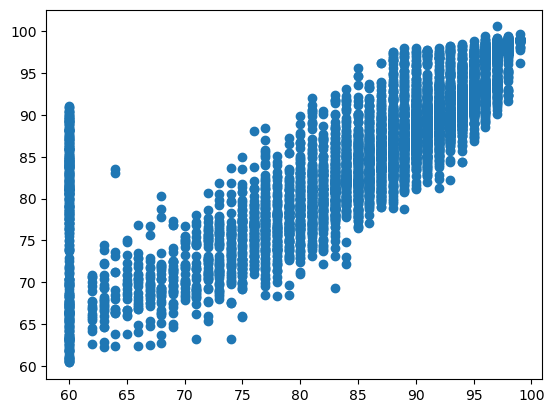

In [127]:
plt.scatter(y_train, predicted_train)
plt.show()

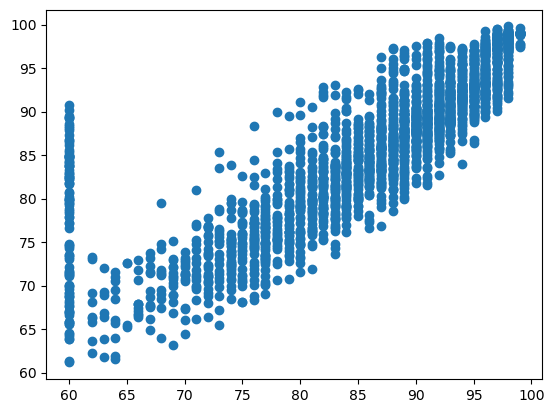

In [128]:
plt.scatter(y_test, y_pred)
plt.show()

In [129]:
for i,j in np.array(model.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(88.98) * const + (-0.06) * lread + (0.02) * lwrite + (-0.0) * scall + (-0.0) * sread + (-0.01) * swrite + (-0.1) * fork + (-0.32) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.29) * pgout + (0.03) * ppgout + (0.01) * pgfree + (-0.0) * pgscan + (0.06) * atch + (-0.08) * pgin + (0.01) * ppgin + (-0.02) * pflt + (-0.01) * vflt + (0.0) * freemem + (0.0) * freeswap + (2.13) * runqsz_Not_CPU_Bound + 

In [130]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [131]:
vif = [variance_inflation_factor(X.values, ix) for ix in range(X.shape[1])] 

In [132]:
i=0
for column in X.columns:
    if i < 15:
        print (column ,"--->",  vif[i])
        i = i+1

lread ---> 6.546975816211261
lwrite ---> 4.481089649117559
scall ---> 9.35576279184697
sread ---> 19.270379440734164
swrite ---> 16.343355756996427
fork ---> 16.57081905169149
exec ---> 4.140547939116197
rchar ---> 4.275582278861992
wchar ---> 2.698968054952935
pgout ---> 6.622622899019428
ppgout ---> 11.9924436430458
pgfree ---> 11.391010029883274
pgscan ---> 4.735707224300264
atch ---> 1.895773594762528
pgin ---> 13.629760951475378


## 1.4) Ans: Refer business report

## 2.1) Ans: 

In [133]:
df_new = pd.read_excel("Contraceptive_method_dataset.xlsx")

In [134]:
df_new.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [135]:
df_new.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [136]:
df_new.shape
print('There are', df_new.shape[0],'rows and', df_new.shape[1],'columns.')

There are 1473 rows and 10 columns.


In [137]:
# Basic info of the dataset
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [138]:
# Duplicate values
dups=df_new.duplicated().sum()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 80


In [139]:
# dropping duplicates
df_new.drop_duplicates(inplace=True) 

In [140]:
dups=df_new.duplicated().sum()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [141]:
# Null values
df_new.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [142]:
df_new.isnull().sum()[df_new.isnull().sum()>0] 

Wife_age               67
No_of_children_born    21
dtype: int64

In [143]:
# Imputing null values with median
for column in df_new.columns:
    if df_new[column].dtype != 'object':
        median = df_new[column].median()
        df_new[column] = df_new[column].fillna(median)    
        
df_new.isnull().sum() 

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [144]:
df_new.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1393.0,32.530510,8.088188,16.0,26.0,32.0,38.0,49.0
No_of_children_born,1393.0,3.286432,2.381791,0.0,1.0,3.0,5.0,16.0
Husband_Occupation,1393.0,2.174444,0.854590,1.0,1.0,2.0,3.0,4.0


In [145]:
df_new.describe(include='object').T

,count,unique,top,freq
Wife_ education,1393,4,Tertiary,515
Husband_education,1393,4,Tertiary,827
Wife_religion,1393,2,Scientology,1186
Wife_Working,1393,2,No,1043
Standard_of_living_index,1393,4,Very High,618
Media_exposure,1393,2,Exposed,1284
Contraceptive_method_used,1393,2,Yes,779


**Observations:**
- Wife age ranges from minimum of 16 to maximum of 49.
- Number of children born ranges from minimum of 0 to maximum of 16.
- About 1043 of wives are not working.
- About 1284 of them are exposed to media.
- About 779 use contraceptive method.

In [146]:
# unique values of categorical data
for column in df_new.columns:
    if df_new[column].dtype == 'object':
        print(column.upper(),': ',df_new[column].nunique())
        print(df_new[column].value_counts().sort_values())
        print('\n')

WIFE_ EDUCATION :  4
Uneducated    150
Primary       330
Secondary     398
Tertiary      515
Name: Wife_ education, dtype: int64


HUSBAND_EDUCATION :  4
Uneducated     44
Primary       175
Secondary     347
Tertiary      827
Name: Husband_education, dtype: int64


WIFE_RELIGION :  2
Non-Scientology     207
Scientology        1186
Name: Wife_religion, dtype: int64


WIFE_WORKING :  2
Yes     350
No     1043
Name: Wife_Working, dtype: int64


STANDARD_OF_LIVING_INDEX :  4
Very Low     129
Low          227
High         419
Very High    618
Name: Standard_of_living_index, dtype: int64


MEDIA_EXPOSURE  :  2
Not-Exposed     109
Exposed        1284
Name: Media_exposure , dtype: int64


CONTRACEPTIVE_METHOD_USED :  2
No     614
Yes    779
Name: Contraceptive_method_used, dtype: int64




Wife_age


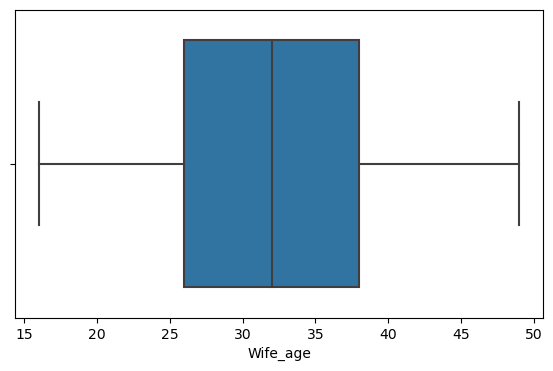

No_of_children_born


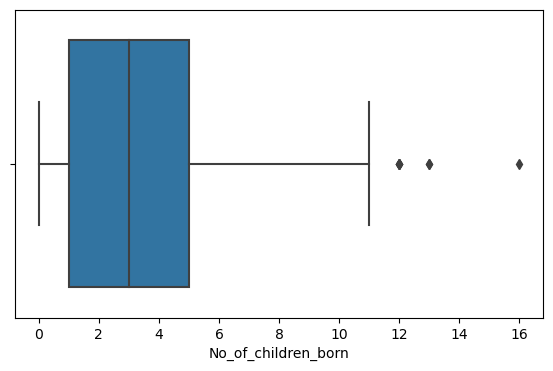

Husband_Occupation


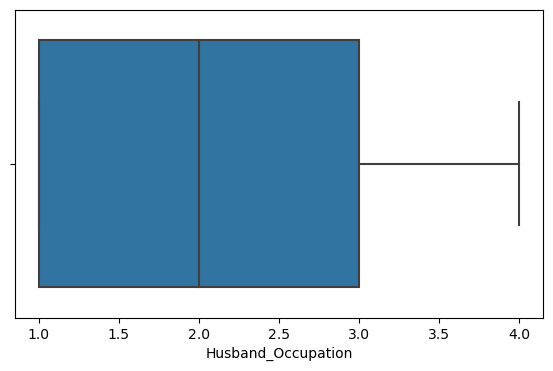

In [147]:
# Outliers
cols = ['Wife_age','No_of_children_born','Husband_Occupation']
for col in cols[0:]:
    print(col)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    sns.boxplot(x=df_new[col])
    plt.show()

In [148]:
# Treating Outliers using IQR method
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [149]:
lr,ur=remove_outlier(df_new['No_of_children_born'])
print('Lower Range :',lr,'\nUpper Range :',ur)
df_new['No_of_children_born']=np.where(df_new['No_of_children_born']>ur,ur,df_new['No_of_children_born'])
df_new['No_of_children_born']=np.where(df_new['No_of_children_born']<lr,lr,df_new['No_of_children_born'])

Lower Range : -5.0 
Upper Range : 11.0


In [150]:
for column in df_new.columns:
     if df_new[column].dtype != 'object': 
         lr,ur=remove_outlier(df_new[column])
         df_new[column]=np.where(df_new[column]>ur,ur,df_new[column])
         df_new[column]=np.where(df_new[column]<lr,lr,df_new[column])

Wife_age


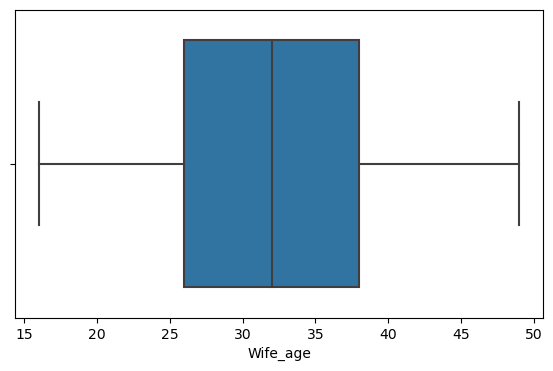

No_of_children_born


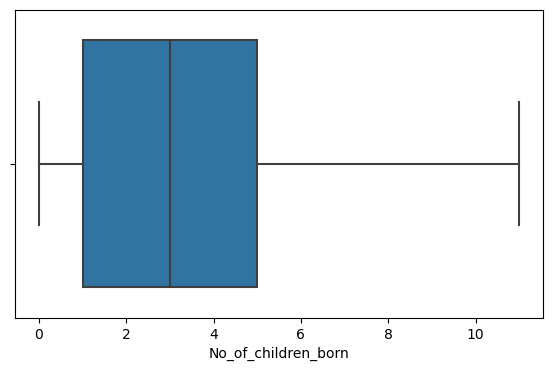

Husband_Occupation


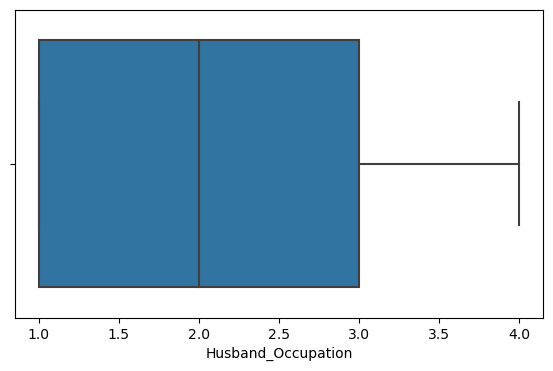

In [151]:
cols = ['Wife_age','No_of_children_born','Husband_Occupation']
for col in cols[0:]:
    print(col)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    sns.boxplot(x=df_new[col])
    plt.show()

In [152]:
# shape after removing duplicates
df_new.shape
print('There are', df_new.shape[0],'rows and', df_new.shape[1],'columns.')

There are 1393 rows and 10 columns.


### univariate Analysis

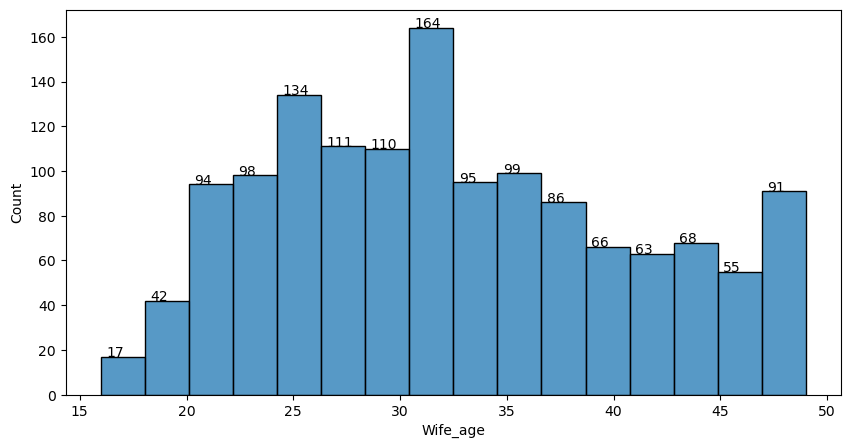

In [153]:
# a) Wife_age
plt.figure(figsize=(10,5))
ax=sns.histplot(df_new, x = 'Wife_age')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

In [154]:
df_new.Wife_age.describe()

count    1393.000000
mean       32.530510
std         8.088188
min        16.000000
25%        26.000000
50%        32.000000
75%        38.000000
max        49.000000
Name: Wife_age, dtype: float64

**Observations**
- The average number of wife age is 32.53.
- wife age ranges from 16 to 49.
- About 75% of the wife age fall under 38.

In [155]:
df_new.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

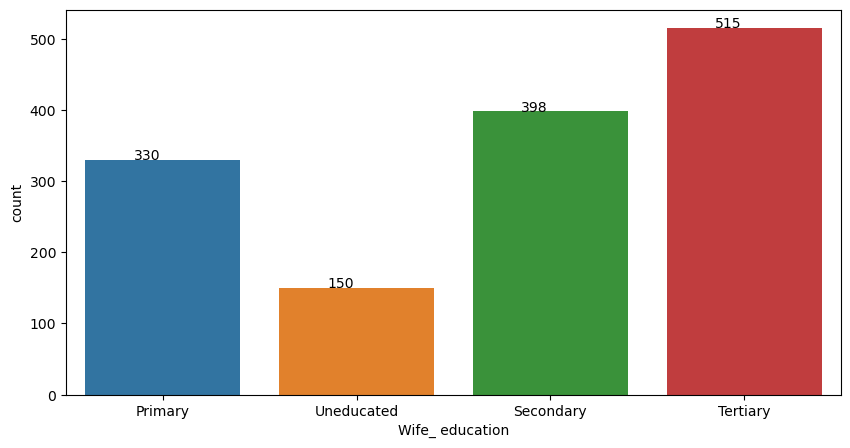

In [156]:
# b) Wife_ education
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'Wife_ education')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

**Observations**
- Most of the wives have Tertiary education.
- 150 of 1393 wives are uneducated.
- 330 wives have Primary education and 398 have Secondary education.

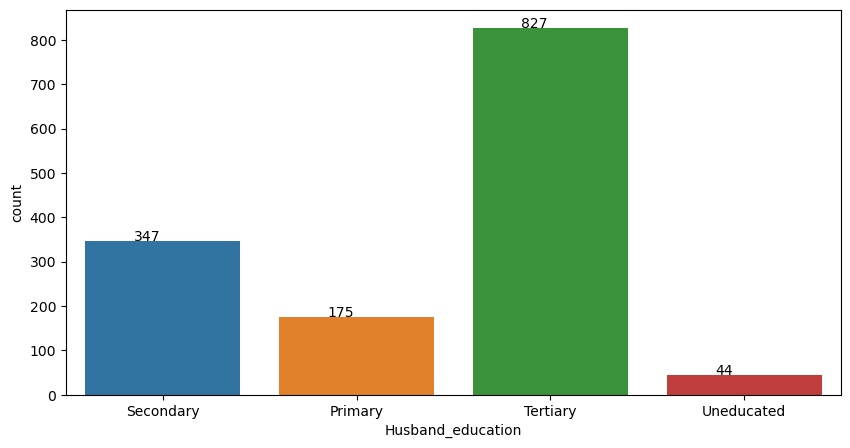

In [157]:
# c) Husband_education
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'Husband_education')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

**Observations**
- About 44 of 1393 husbands are uneducated.
- 827 of 1393 husbands have Tertiary education.
- 175 husbands have Primary education and 347 have Secondary education.

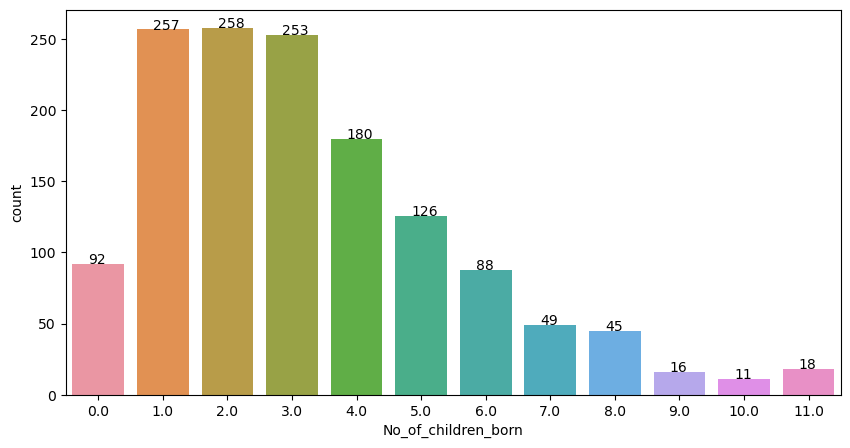

In [158]:
# d) No_of_children_born
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'No_of_children_born')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

In [159]:
df_new.No_of_children_born.describe()

count    1393.000000
mean        3.277100
std         2.345673
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max        11.000000
Name: No_of_children_born, dtype: float64

**Observations**
- Average number of children born are 3.
- Number of children born ranges from 0 to 11.
- About 258 of 1393 wives have 2 children.
- About 257 of 1393 wives have 1 child.
- About 92 of 1393 wives have no children.
- About 11 wives have 10 children.

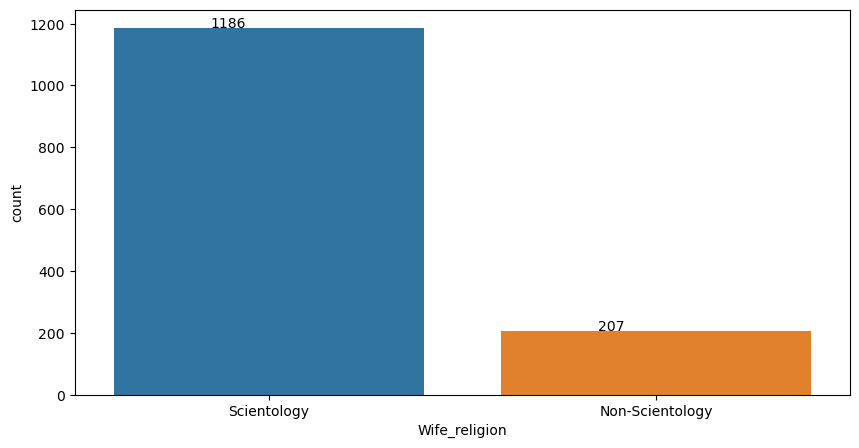

In [160]:
# e) Wife_religion
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'Wife_religion')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

**Observations**
- About 1186 of 1393 wives are Scientology.
- About 207 of 1393 wives are non-Scientology.

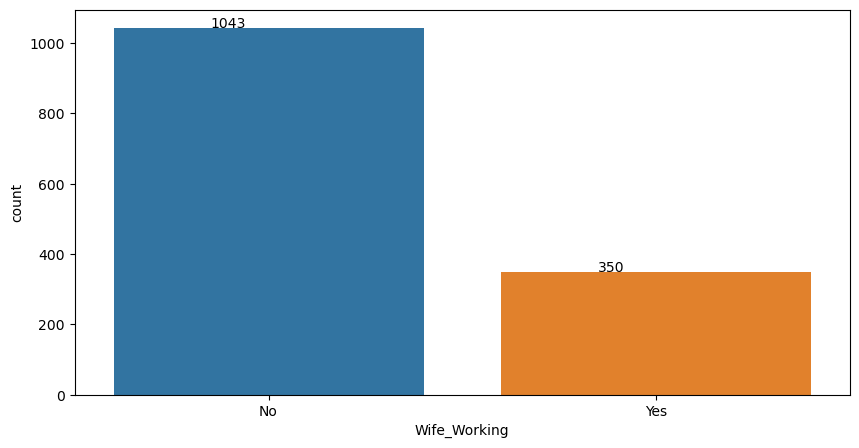

In [161]:
# f) Wife_Working
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'Wife_Working')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

**Observations**
- About 1043 of 1393 wives are working.
- About 350 wives are not working.

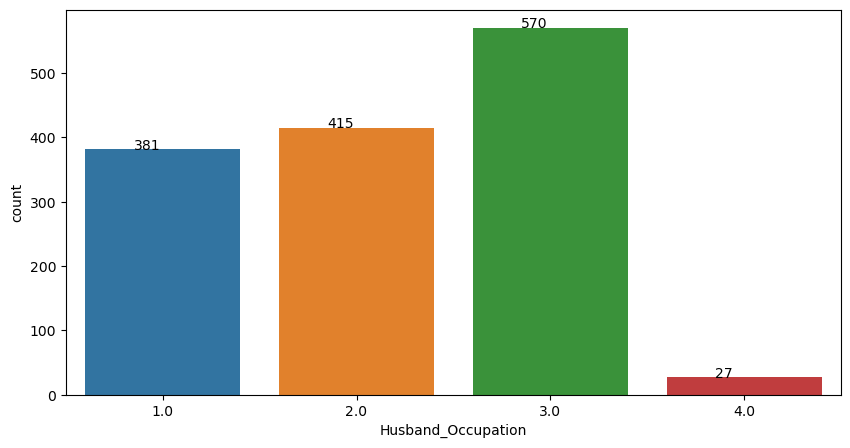

In [162]:
# g) Husband_Occupation
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'Husband_Occupation')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

**Observations**
- About 27 of 1393 husbands have very high occupation.

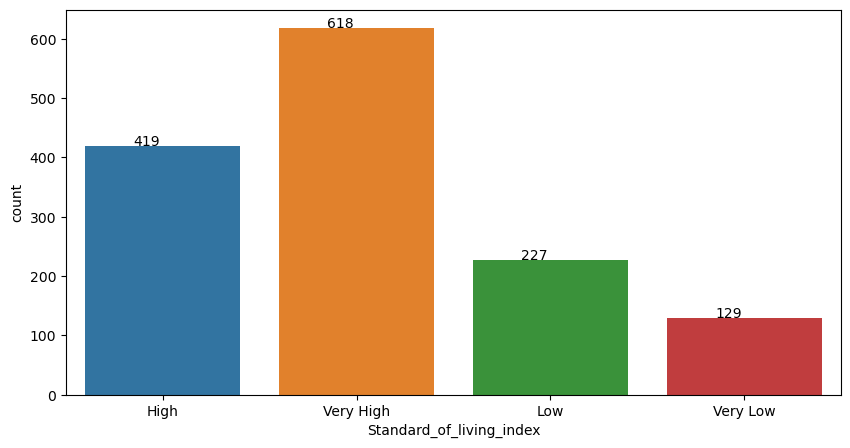

In [163]:
# h) Standard_of_living_index
plt.figure(figsize=(10,5))
ax=sns.countplot(df_new, x = 'Standard_of_living_index')
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01));

**Observations**
- 129 of 1393 have very low standard of living index.
- 618 of 1393 have very high standard of living index.
- 419 of 1393 have high standard of living index.
- 227 of 1393 have low standard of living index.

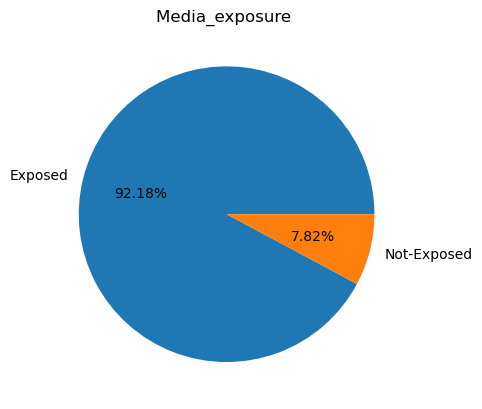

In [164]:
# i) Media_exposure
plt.pie(df_new['Media_exposure '].value_counts(), labels=df_new['Media_exposure '].value_counts().index, autopct = '%1.2f%%')
plt.title ('Media_exposure ');

**Observations**
- 92.18% of wives are exposed to Media.
- 7.82% of wives are not exposed to Media.

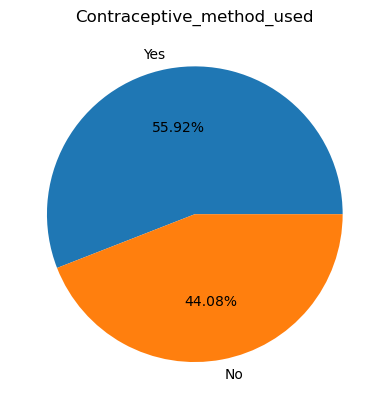

In [165]:
# j) Contraceptive_method_used
plt.pie(df_new['Contraceptive_method_used'].value_counts(), labels=df_new['Contraceptive_method_used'].value_counts().index, autopct = '%1.2f%%')
plt.title ('Contraceptive_method_used');

**Observations**
- 55.92% of wives use contraceptive method.
- 44.09% of wives do not use contraceptive method.

### Bivariate and Multivariate Analysis

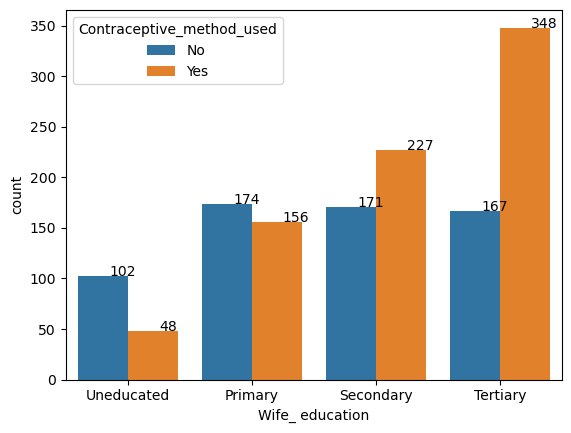

In [166]:
# a) Wife_ education and Contraceptive_method_used:

ax=sns.countplot(data=df_new, x='Wife_ education', hue='Contraceptive_method_used', order= ['Uneducated', 'Primary', 'Secondary', 'Tertiary']) 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

**Observations**
- The above countplot states that wives with Tertiary education use contraceptive method much higher than the other groups.
- Uneducated wives are the less users of contraceptive method.
- Education plays a vital role in the usage of contraceptive methods.

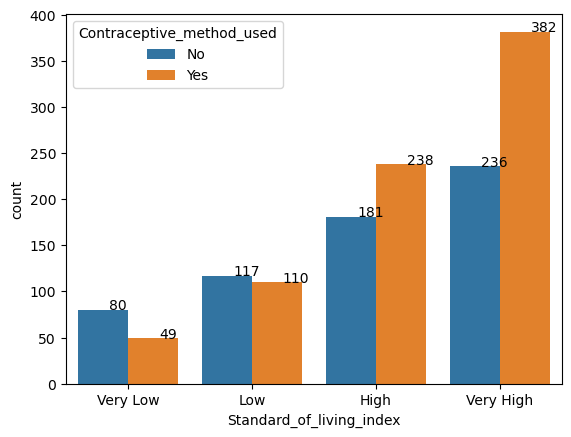

In [167]:
# b) Standard_of_living_index and Contraceptive_method_used:
ax=sns.countplot(data=df_new, x='Standard_of_living_index', hue='Contraceptive_method_used', order= ['Very Low', 'Low', 'High', 'Very High']) 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

**Observations**
- Wives with very low standard of living use contraceptive method in a very less manner.
- The above countplot states that wives with very high standard of living use contraceptive method much higher than the other groups.
- Standard of living also plays a vital role in the usage of contraceptive methods.

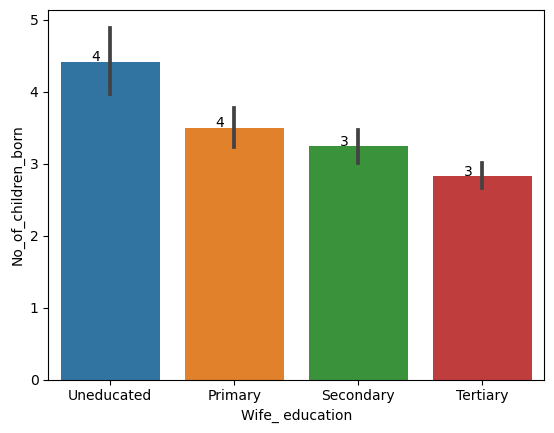

In [168]:
# c) Wife_ education and No_of_children_born:
ax=sns.barplot(data=df_new, x="Wife_ education", y='No_of_children_born', order= ['Uneducated', 'Primary', 'Secondary', 'Tertiary']) 
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

**Observations**
- The above barplot states that wives who are uneducated have more number of children.
- Wives with tertiary education have less number of children when compared with other groups.

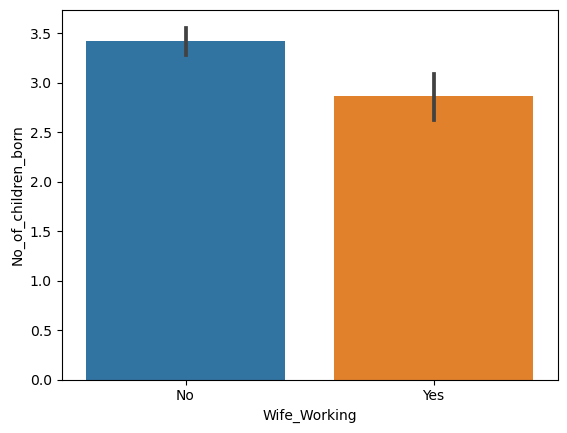

In [169]:
# d) Wife_ working and No_of_children_born:
ax=sns.barplot(data=df_new, x='Wife_Working', y='No_of_children_born') 
plt.show()

**Observations**
- The above barplot states that the wives who are working have less number of children.
- Wives who are not working have more number of children.

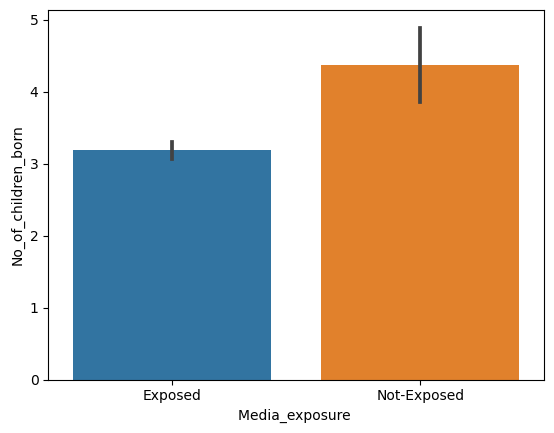

In [170]:
# e) Media exposure and No_of_children_born:
ax=sns.barplot(data=df_new, x='Media_exposure ', y='No_of_children_born') 
plt.show()

**Observations**
- The above barplot states that the wives who are exposed to media have less number of children.
- Wives who do not have media exposure have more number of children.

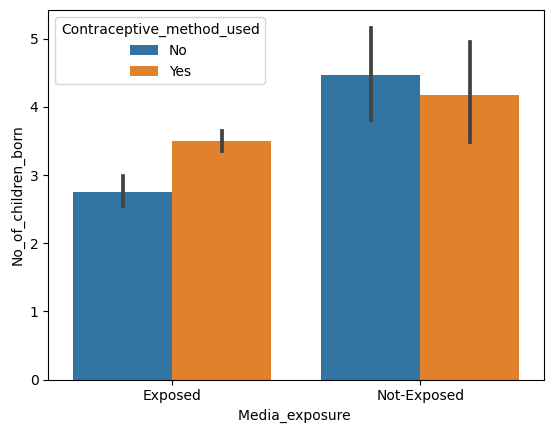

In [171]:
# f) Media exposure, No_of_children_born and Contraceptive_method_used:
ax=sns.barplot(data=df_new, x='Media_exposure ', y='No_of_children_born', hue='Contraceptive_method_used') 
plt.show()

**Observations**
- The above barplot states that the wives who are exposed to media have less number of children and are the users of contraceptive method in a high manner than that of non users.
- Wives who do not have media exposure have more number of children and are the less users of contraceptive method comparatively.

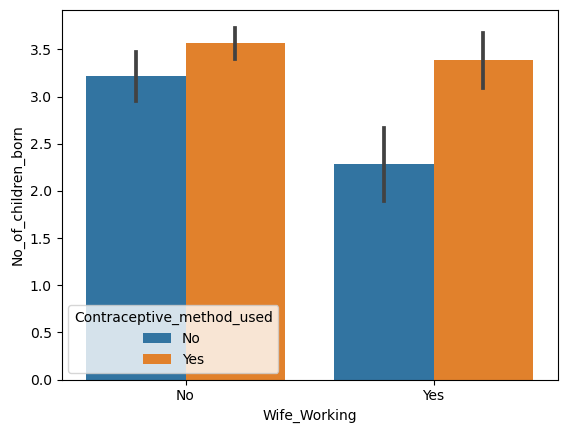

In [172]:
# g) Wife_Working, No_of_children_born and Contraceptive_method_used:
ax=sns.barplot(data=df_new, x='Wife_Working', y='No_of_children_born', hue='Contraceptive_method_used') 
plt.show()

**Observations**
- The above barplot states that the wives who are working have less number of children and are the more users of contraceptive methods comparatively.
- Wives who are not working have more number of children and are the more users of contraceptive methods than the non users.

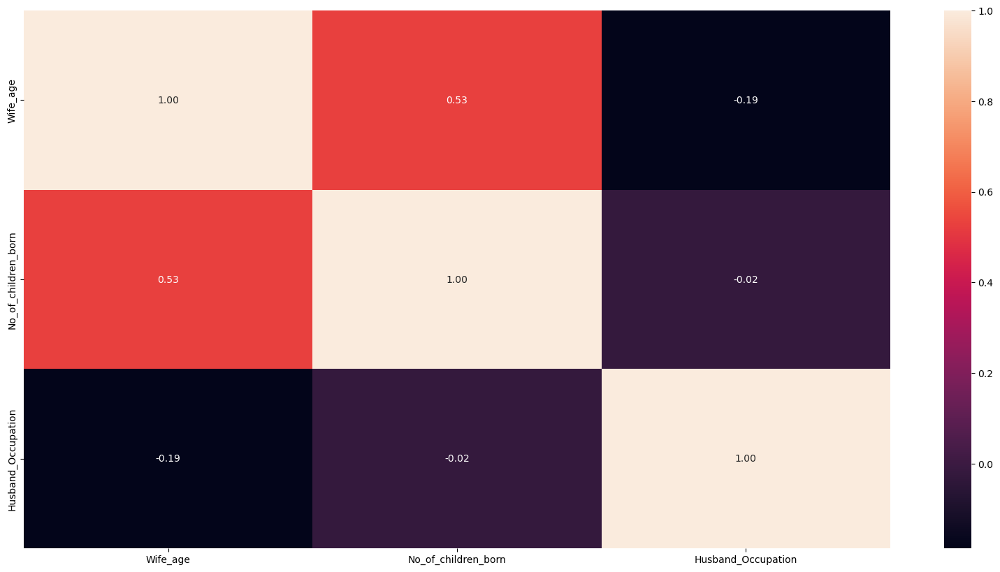

In [173]:
# h) Correlation
plt.figure(figsize = (20,10))
sns.heatmap(df_new.corr(), annot=True,fmt='.2f');

**Observations**
- Wife age and number of children are positively correlated i.e., by 0.53.
- Wife age and husband occupation are negatively correlated i.e., by -0.19.
- Number of children and husband occupation are weakly related i.e., by -0.02 which means there is a negative relationship between the variables.

# 2.2) Ans:  &  2.3) Ans:

In [174]:
df_new_LR = df_new.copy()
df_new_LR.head(3)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2.0,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3.0,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3.0,Very High,Exposed,No


In [175]:
df_new_LR.head(2)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2.0,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3.0,Very High,Exposed,No


In [176]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()

In [177]:
## Applying the created Label Encoder object for the target class
df_new_LR['Contraceptive_method_used'] = LE.fit_transform(df_new_LR['Contraceptive_method_used'])
df_new_LR.head(3)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2.0,High,Exposed,0
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3.0,Very High,Exposed,0
2,43.0,Primary,Secondary,7.0,Scientology,No,3.0,Very High,Exposed,0


In [178]:
df_new_LR.Contraceptive_method_used.value_counts()

1    779
0    614
Name: Contraceptive_method_used, dtype: int64

In [179]:
## Converting the other 'object' type variables as dummy variables
df_new_LR_dummy = pd.get_dummies(df_new_LR,drop_first=True)
df_new_LR_dummy.head()

,Wife_age,No_of_children_born,Husband_Occupation,Contraceptive_method_used,Wife_ education_Secondary,Wife_ education_Tertiary,Wife_ education_Uneducated,Husband_education_Secondary,Husband_education_Tertiary,Husband_education_Uneducated,Wife_religion_Scientology,Wife_Working_Yes,Standard_of_living_index_Low,Standard_of_living_index_Very High,Standard_of_living_index_Very Low,Media_exposure _Not-Exposed
0,24.0,3.0,2.0,0,0,0,0,1,0,0,1,0,0,0,0,0
1,45.0,10.0,3.0,0,0,0,1,1,0,0,1,0,0,1,0,0
2,43.0,7.0,3.0,0,0,0,0,1,0,0,1,0,0,1,0,0
3,42.0,9.0,3.0,0,1,0,0,0,0,0,1,0,0,0,0,0
4,36.0,8.0,3.0,0,1,0,0,1,0,0,1,0,1,0,0,0


**Train Test Split**

In [180]:
X = df_new_LR_dummy.drop('Contraceptive_method_used', axis=1)

# Copy target into the y dataframe. 
y = df_new_LR_dummy['Contraceptive_method_used']

In [181]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=123,stratify=df_new_LR_dummy['Contraceptive_method_used'])

In [182]:
y_train.value_counts(1)

1    0.558974
0    0.441026
Name: Contraceptive_method_used, dtype: float64

In [183]:
y_test.value_counts(1)

1    0.559809
0    0.440191
Name: Contraceptive_method_used, dtype: float64

## 2.2.a) Logistic Regression Model

In [184]:
# Fit the Logistic Regression model
model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2)
model.fit(X_train, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    1.1s finished


LogisticRegression(max_iter=10000, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

In [185]:
# Predicting on Train and Test dataset
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

In [186]:
model.predict_proba(X_train)

array([[0.17441285, 0.82558715],
       [0.46271278, 0.53728722],
       [0.69413704, 0.30586296],
       ...,
       [0.33503026, 0.66496974],
       [0.7145228 , 0.2854772 ],
       [0.60967449, 0.39032551]])

In [187]:
# Getting the Predicted Classes and Probs
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.183460,0.816540
1,0.712886,0.287114
2,0.287220,0.712780
3,0.583461,0.416539
4,0.450613,0.549387


## 2.3.a) Logistic Regression Model

In [188]:
# model evaluation
# Accuracy - Training Data
model.score(X_train, y_train)

0.6738461538461539

In [189]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.6339712918660287

### AUC and ROC for the training data

AUC: 0.714


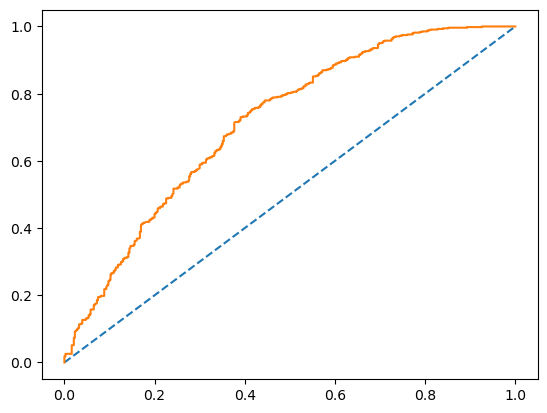

In [190]:
# predict probabilities
probs = model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [191]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.6339712918660287

### AUC and ROC for the test data

AUC: 0.714


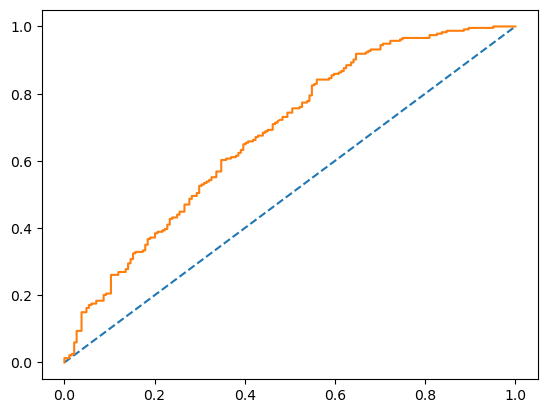

In [192]:
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

### Confusion Matrix for the training data

In [193]:
confusion_matrix(y_train, ytrain_predict)

array([[227, 203],
       [115, 430]], dtype=int64)

In [194]:
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay

In [195]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.66      0.53      0.59       430
           1       0.68      0.79      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975



### Confusion Matrix for the test data

In [196]:
confusion_matrix(y_test, ytest_predict)

array([[ 91,  93],
       [ 60, 174]], dtype=int64)

In [197]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.60      0.49      0.54       184
           1       0.65      0.74      0.69       234

    accuracy                           0.63       418
   macro avg       0.63      0.62      0.62       418
weighted avg       0.63      0.63      0.63       418



### Applying GridSearchCV for Logistic Regression

In [198]:
grid={'penalty':['l2','none'],
      'solver':['sag','lbfgs'],
      'tol':[0.0001,0.00001]}

In [199]:
model = LogisticRegression(max_iter=10000,n_jobs=2)

In [200]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 3,n_jobs=-1,scoring='f1')

In [201]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none'], 'solver': ['sag', 'lbfgs'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [202]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'sag', 'tol': 1e-05} 

LogisticRegression(max_iter=10000, n_jobs=2, solver='sag', tol=1e-05)


In [203]:
best_model = grid_search.best_estimator_

In [204]:
# Prediction on the training set

ytrain_predict = best_model.predict(X_train)
ytest_predict = best_model.predict(X_test)

In [205]:
ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.190411,0.809589
1,0.706948,0.293052
2,0.290729,0.709271
3,0.579919,0.420081
4,0.439802,0.560198


In [206]:
confusion_matrix(y_train, ytrain_predict)

array([[224, 206],
       [117, 428]], dtype=int64)

In [207]:
## Confusion matrix on the training data

#plot_confusion_matrix(best_model,X_train,y_train)
print(classification_report(y_train, ytrain_predict),'\n');

              precision    recall  f1-score   support

           0       0.66      0.52      0.58       430
           1       0.68      0.79      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.65      0.65       975
weighted avg       0.67      0.67      0.66       975
 



In [208]:
confusion_matrix(y_test, ytest_predict)

array([[ 93,  91],
       [ 57, 177]], dtype=int64)

In [209]:
## Confusion matrix on the test data

#plot_confusion_matrix(best_model,X_test,y_test)
print(classification_report(y_test, ytest_predict),'\n');

              precision    recall  f1-score   support

           0       0.62      0.51      0.56       184
           1       0.66      0.76      0.71       234

    accuracy                           0.65       418
   macro avg       0.64      0.63      0.63       418
weighted avg       0.64      0.65      0.64       418
 



## 2.2.b) CART

In [210]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=123,stratify=df_new_LR_dummy['Contraceptive_method_used'])

In [211]:
dt_model = DecisionTreeClassifier(criterion = 'gini' )

In [212]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [213]:
from sklearn import tree

train_char_label = ['No', 'Yes']
Credit_Tree_File = open('C:\\Users\\lenovo\\Python Course\\PDS-Project\\Predictive Modelling\\Contraceptive_method_dataset.dot','w')
dot_data = tree.export_graphviz(dt_model, out_file=Credit_Tree_File, feature_names = list(X_train), class_names = list(train_char_label))

Credit_Tree_File.close()


In [214]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                                         Imp
Wife_age                            0.340569
No_of_children_born                 0.219109
Husband_Occupation                  0.076613
Wife_ education_Secondary           0.029767
Wife_ education_Tertiary            0.034139
Wife_ education_Uneducated          0.030392
Husband_education_Secondary         0.038321
Husband_education_Tertiary          0.023067
Husband_education_Uneducated        0.006004
Wife_religion_Scientology           0.031806
Wife_Working_Yes                    0.046286
Standard_of_living_index_Low        0.027904
Standard_of_living_index_Very High  0.051612
Standard_of_living_index_Very Low   0.026789
Media_exposure _Not-Exposed         0.017623


In [215]:
y_predict = dt_model.predict(X_test)

### Regularising the Decision Tree

In [216]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [217]:
credit_tree_regularized = open('C:\\Users\\lenovo\\Python Course\\PDS-Project\\Predictive Modelling\\Contraceptive_method_dataset_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                                         Imp
Wife_age                            0.340569
No_of_children_born                 0.219109
Husband_Occupation                  0.076613
Wife_ education_Secondary           0.029767
Wife_ education_Tertiary            0.034139
Wife_ education_Uneducated          0.030392
Husband_education_Secondary         0.038321
Husband_education_Tertiary          0.023067
Husband_education_Uneducated        0.006004
Wife_religion_Scientology           0.031806
Wife_Working_Yes                    0.046286
Standard_of_living_index_Low        0.027904
Standard_of_living_index_Very High  0.051612
Standard_of_living_index_Very Low   0.026789
Media_exposure _Not-Exposed         0.017623


In [218]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

In [219]:
ytrain_predict

array([1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1,

In [220]:
ytest_predict

array([1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0,

## 2.3.b) CART

In [221]:
import matplotlib.pyplot as plt

AUC: 0.820


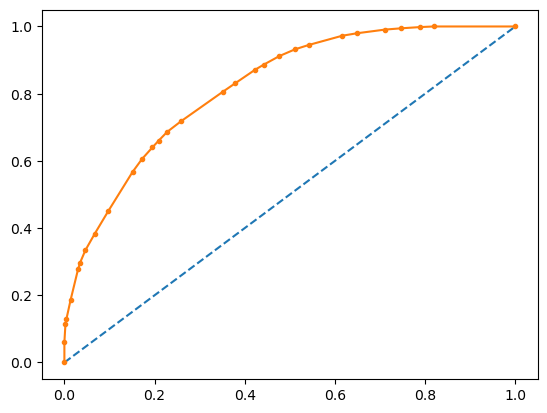

In [222]:
# AUC and ROC for the training data

# predict probabilities
probs = reg_dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

AUC: 0.733


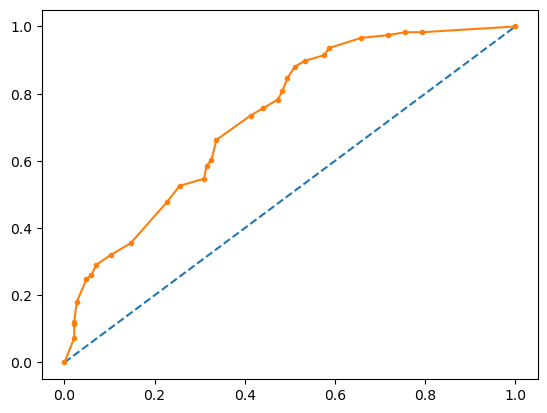

In [223]:
# AUC and ROC for the test data


# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [224]:
from sklearn.metrics import classification_report,confusion_matrix

In [225]:
# Train data
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.78      0.58      0.66       430
           1       0.72      0.87      0.79       545

    accuracy                           0.74       975
   macro avg       0.75      0.72      0.73       975
weighted avg       0.75      0.74      0.73       975



In [226]:
# Test data
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.66      0.53      0.58       184
           1       0.68      0.78      0.73       234

    accuracy                           0.67       418
   macro avg       0.67      0.65      0.66       418
weighted avg       0.67      0.67      0.66       418



In [227]:
# Train data
confusion_matrix(y_train, ytrain_predict)

array([[248, 182],
       [ 70, 475]], dtype=int64)

In [228]:
# Test data
confusion_matrix(y_test, ytest_predict)

array([[ 97,  87],
       [ 51, 183]], dtype=int64)

In [229]:
# model evaluation
# Accuracy - Training Data
reg_dt_model.score(X_train,y_train)

0.7415384615384616

In [230]:
# model evaluation
# Accuracy - Test Data
reg_dt_model.score(X_test,y_test)

0.6698564593301436

## 2.2.c) LDA

In [231]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size=0.30,random_state=123,stratify = df_new_LR_dummy['Contraceptive_method_used'])

In [232]:
print('Number of rows and columns of the training set for the independent variables:',X_train.shape)
print('Number of rows and columns of the training set for the dependent variable:',y_train.shape)
print('Number of rows and columns of the test set for the independent variables:',X_test.shape)
print('Number of rows and columns of the test set for the dependent variable:',y_test.shape)

Number of rows and columns of the training set for the independent variables: (975, 15)
Number of rows and columns of the training set for the dependent variable: (975,)
Number of rows and columns of the test set for the independent variables: (418, 15)
Number of rows and columns of the test set for the dependent variable: (418,)


In [233]:
clf = LinearDiscriminantAnalysis()
model=clf.fit(X_train,y_train)

In [234]:
# Train Data Class Prediction with a cut-off value of 0.5
pred_class_train = model.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
pred_class_test = model.predict(X_test)

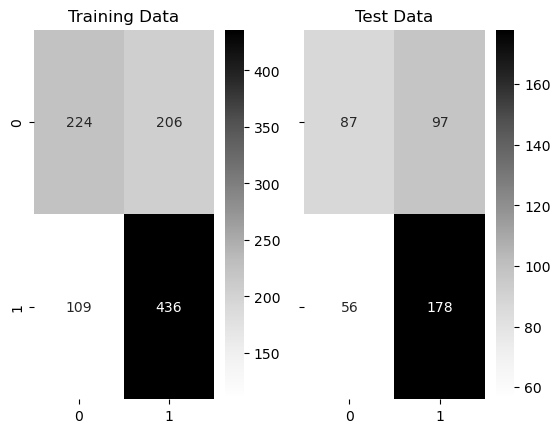

In [235]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(y_train,pred_class_train)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,pred_class_test)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Test Data');

## 2.3.c) LDA

In [236]:
# model evaluation
# Accuracy - Training Data
model.score(X_train,y_train)

0.676923076923077

In [237]:
# model evaluation
# Accuracy - Test Data
model.score(X_test,y_test)

0.6339712918660287

In [238]:
# Train data
confusion_matrix(y_train, pred_class_train)

array([[224, 206],
       [109, 436]], dtype=int64)

In [239]:
# Test data
confusion_matrix(y_test, pred_class_test)

array([[ 87,  97],
       [ 56, 178]], dtype=int64)

In [240]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,pred_class_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,pred_class_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.67      0.52      0.59       430
           1       0.68      0.80      0.73       545

    accuracy                           0.68       975
   macro avg       0.68      0.66      0.66       975
weighted avg       0.68      0.68      0.67       975
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.61      0.47      0.53       184
           1       0.65      0.76      0.70       234

    accuracy                           0.63       418
   macro avg       0.63      0.62      0.62       418
weighted avg       0.63      0.63      0.63       418
 



In [241]:
# Training Data Probability Prediction
pred_prob_train = model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = model.predict_proba(X_test)

In [242]:
pred_prob_train[:,1]

array([0.8322338 , 0.53614881, 0.31225187, 0.58313459, 0.54804258,
       0.34371614, 0.42531346, 0.71428564, 0.10355985, 0.71097206,
       0.20597382, 0.56949355, 0.35770806, 0.78646366, 0.42560393,
       0.68567738, 0.72965536, 0.35798068, 0.83721691, 0.63394752,
       0.81264764, 0.85159833, 0.55042976, 0.28709568, 0.42444162,
       0.6987824 , 0.23221266, 0.33593909, 0.79064197, 0.59850797,
       0.30637606, 0.81356943, 0.52852318, 0.80283108, 0.6985405 ,
       0.20146051, 0.81127408, 0.55697337, 0.40827556, 0.54400801,
       0.33575938, 0.68327019, 0.82055871, 0.37191551, 0.59964807,
       0.5651852 , 0.83523145, 0.15141921, 0.4922527 , 0.52392817,
       0.80754558, 0.7587188 , 0.82763401, 0.36730696, 0.66107265,
       0.76921557, 0.70561413, 0.78197881, 0.71306568, 0.24776669,
       0.71966187, 0.33124407, 0.70349303, 0.58656983, 0.72198561,
       0.78896635, 0.71839599, 0.4267619 , 0.68053315, 0.47754474,
       0.47008999, 0.82687743, 0.06047247, 0.11738214, 0.86301

In [243]:
pred_prob_test[:,1]

array([0.81865279, 0.29602709, 0.71759732, 0.42702567, 0.5364965 ,
       0.70393918, 0.60584429, 0.57834007, 0.85015199, 0.38240825,
       0.67428395, 0.22966325, 0.42188339, 0.63937155, 0.17123075,
       0.81857431, 0.83023878, 0.47442487, 0.61343143, 0.89450691,
       0.31799393, 0.75695264, 0.4793547 , 0.20409907, 0.27767773,
       0.62161035, 0.82919502, 0.49373325, 0.69691008, 0.3074374 ,
       0.80414977, 0.85821305, 0.63867177, 0.57335395, 0.84255051,
       0.35224689, 0.48363488, 0.52648784, 0.25929516, 0.54999484,
       0.82539038, 0.6167401 , 0.63300499, 0.65860084, 0.83838436,
       0.48698851, 0.28223555, 0.03540808, 0.7459538 , 0.56702643,
       0.2913924 , 0.53732466, 0.59718618, 0.76886884, 0.76605874,
       0.43763581, 0.65816211, 0.23133881, 0.4585153 , 0.69207232,
       0.87520106, 0.51856369, 0.2861127 , 0.1823641 , 0.78346627,
       0.62957774, 0.64676641, 0.47432193, 0.09134582, 0.66458176,
       0.71023477, 0.60902056, 0.56651912, 0.02982132, 0.55737

AUC for the Training Data: 0.714
AUC for the Test Data: 0.679


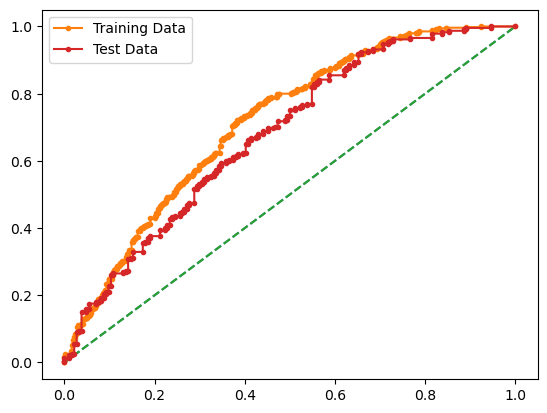

In [244]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(y_train,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(y_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

AUC: 0.714


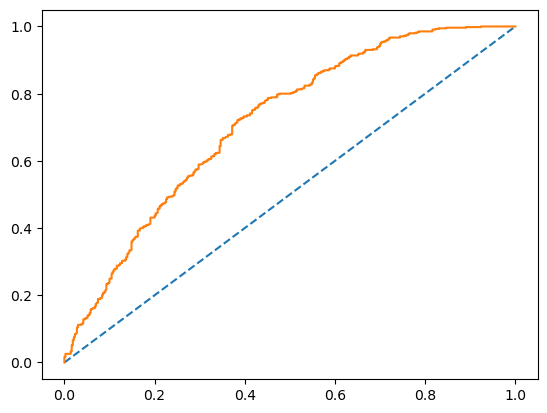

In [245]:
# predict probabilities
probs = model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

AUC: 0.679


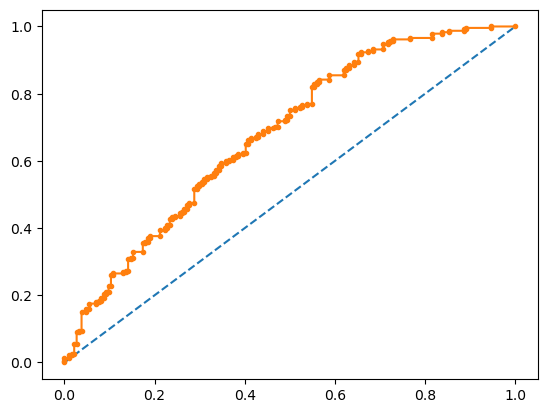

In [246]:
# AUC and ROC for the test data


# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [247]:
from sklearn.metrics import accuracy_score
dtc = DecisionTreeClassifier()
lda= LinearDiscriminantAnalysis()
lor= LogisticRegression()


models=[dtc,lda,lor]


accuracy_train=[]
accuracy_test=[]


for i in models:  
    i.fit(X_train,y_train)
    accuracy_train.append(accuracy_score(y_train,i.predict(X_train)))
    accuracy_test.append(accuracy_score(y_test,i.predict(X_test)))
        
print(pd.DataFrame({'Train Accuracy': accuracy_train,'Test Accuracy': accuracy_test},
            index=['Decision Tree Classifier','LDA','Logistic Regression']))

                          Train Accuracy  Test Accuracy
Decision Tree Classifier        0.982564       0.598086
LDA                             0.676923       0.633971
Logistic Regression             0.670769       0.645933


## 2.4) Ans: Refer business report